# XClone demo TNBC1 scRNA-seq
version 0.0.3

scRNA-seq data

Author: Rongting Huang


Date: 2022-10-07

In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
import xclone
xclone.__version__

import pandas as pd
import numpy as np
import scipy
scipy.__version__

xclone.pp.efficiency_preview()

import warnings
warnings.filterwarnings('ignore')

'0.3.0'

'1.7.0'

[XClone efficiency] multiprocessing cpu total count in your device 112


## Part I Data Prechecking

### 01-Genome chr order checking

#### RDR module

In [ ]:
# ## TNBC1 RDR  
# RDRdat_dir = '/storage/yhhuang/users/rthuang/processed_data/xcltk-new/TNBC1_071622/TNBC1-rdr-rna-fet/'
# mtx_file = RDRdat_dir + 'matrix.mtx'

# # ## preprocessing reorder the chrs - reorder the mtx first)-- see mtx_order_preprocessing
# features_file = dat_dir + "features.tsv"
# out_RDR_file = dat_dir + "resort_matrix.mtx"
# resort_mtx = xclone.pp.resort_mtx_bychr(mtx_file, features_file, out_file = out_RDR_file, keep_all=True)

#### BAF module

In [ ]:
# ## TNBC1 BAF
# BAFdat_dir = '/storage/yhhuang/users/rthuang/processed_data/xcltk-new/TNBC1_071622/TNBC1-csp-phase-rna/phase-snp-feature/'

# ## preprocessing reorder the chrs - reorder the mtx first)-- see mtx_order_preprocessing
# AD_file = BAFdat_dir + 'xcltk.AD.mtx'
# DP_file = BAFdat_dir + 'xcltk.DP.mtx'

# features_file = BAFdat_dir +  "xcltk.region.tsv"

# out_AD_file = BAFdat_dir + "resort_AD.mtx"
# out_DP_file = BAFdat_dir +  "resort_DP.mtx"


# resort_AD = xclone.pp.resort_mtx_bychr(AD_file, features_file, out_file = out_AD_file, keep_all=True)
# resort_DP = xclone.pp.resort_mtx_bychr(DP_file, features_file, out_file = out_DP_file, keep_all=True)

### 02-Cells order checking-RDR&BAF for combination

In [3]:
RDRdat_dir = '/storage/yhhuang/users/rthuang/processed_data/xcltk-new/TNBC1_071622/TNBC1-rdr-rna-fet/'
RDR_barcodes_file = RDRdat_dir + "barcodes.tsv"

BAFdat_dir = '/storage/yhhuang/users/rthuang/processed_data/xcltk-new/TNBC1_071622/TNBC1-csp-phase-rna/phase-snp-feature/'
BAF_barcodes_file = BAFdat_dir + "xcltk.samples.tsv"

xclone.pp.check_RDR_BAF_anno(BAF_barcodes_file, RDR_barcodes_file)

# if not in the same order: resort RDR mtx by BAF_barcodes order:
# xclone.pp.resort_mtx_bycell(BAF_barcodes_file, RDR_barcodes_file, RDR_mtx_file, out_mtx_file)

[XClone cell anno checking]: RDR and BAF cell anno in the same order.


## Part II Read depth count - RDR module

### params setting

In [90]:
# TNBC1 RDR  
## input and output dir
## files prepared
## params for this dataset

dataset_name = "TNBC1_scRNA"
dat_dir = '/storage/yhhuang/users/rthuang/processed_data/xcltk-new/TNBC1_071622/TNBC1-rdr-rna-fet/'


RDR_file = dat_dir + "resort_matrix.mtx"  # 'matrix.mtx'
mtx_barcodes_file = dat_dir + "barcodes.tsv" # "update_barcodes.tsv"

genome_mode = "hg38_genes"

## extra annotation data
anno_file = "/home/rthuang/ResearchProject/XClone/raw_data/TNBC1_data/tnbc1_TN.txt"

# barcodes_key = "cell"
# cell_anno_key = "cluster.pred"
# ref_celltype = "N"

## output
out_dir = "/storage/yhhuang/users/rthuang/xclone/manuscript/TNBC1_scRNA/data/"
fig_dir = "/storage/yhhuang/users/rthuang/xclone/manuscript/TNBC1_scRNA/plot/"

xclone.al.dir_make(out_dir)
xclone.al.dir_make(fig_dir)


# output before CNV calling
RDR_base_file = out_dir + "RDR_base_adata.h5ad"
RDR_bulk_file = out_dir + "RDR_bulk_adata.h5ad"
# output after CNV calling

# default 1
gene_exp_group = 1
RDR_final_file = out_dir + "RDR_adata_KNN_HMM_post.h5ad"
explore_RDR_file = out_dir + "RDR_adata_KNN_HMM_post_explore.h5ad"

# default:XClone
fig_title = ""

rdr_smooth_fig = fig_dir + dataset_name + "_RDR_smooth.png"
rdr_final_fig = fig_dir + dataset_name + "_RDR_CNV.png"

### II-I: load data and check validation

In [5]:
RDR_adata = xclone.pp.xclonedata(RDR_file, 'RDR', mtx_barcodes_file, genome_mode = "hg38_genes")
RDR_adata = xclone.pp.extra_anno(RDR_adata, anno_file, barcodes_key = "cell", cell_anno_key = "cluster.pred", sep ="\t")

#### extra annotation

In [6]:
seurat_results_file = "/home/rthuang/ResearchProject/XClone/raw_data/TNBC1_data/seurat-tnbc-3cluster-id.txt"
RDR_adata = xclone.pp.extra_anno(RDR_adata, seurat_results_file, barcodes_key = "cell", cell_anno_key = "cluster", sep ="\t")

In [7]:
RDR_adata.obs

,copykat.pred,cluster.pred,cluster
AAACCTGCACCTTGTC-1,T,T,Clone A
AAACGGGAGTCCTCCT-1,N,N,Normal
AAACGGGTCCAGAGGA-1,T,T,Clone A
AAAGATGCAGTTTACG-1,T,T,Clone B
AAAGCAACAGGAATGC-1,T,T,Clone A
...,...,...,...
TTTATGCTCCTCATTA-1,T,T,Clone A
TTTATGCTCTGTTGAG-1,T,T,Clone A
TTTCCTCTCGGAAACG-1,T,T,Clone A
TTTGCGCCAATCACAC-1,T,T,Clone A


In [8]:
RDR_adata

AnnData object with n_obs × n_vars = 1097 × 33472
    obs: 'copykat.pred', 'cluster.pred', 'cluster'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes'
    layers: 'raw_expr'

In [10]:
RDR_adata = xclone.pp.check_RDR(RDR_adata, cell_anno_key = "cluster.pred", cell_detection_rate = 0.05, verbose = True)

[XClone data preprocessing] check RDR raw dataset value: success
Keep valid cells: Filter out 0 cells / 1097 total cells, remain 1097 valid cells with annotation
[XClone data preprocessing] check RDR cell annotation: success
[XClone-RDR preprocessing] Filter out 16315 genes / 33472 total genes, remain 17157 genes
[XClone data preprocessing] detect RDR genes: done


In [11]:
RDR_adata

AnnData object with n_obs × n_vars = 1097 × 17157
    obs: 'copykat.pred', 'cluster.pred', 'cluster'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes'
    layers: 'raw_expr'

#### transformation False for smart-seq

In [12]:
# it is for smart-seq
# RDR_adata = xclone.pp.Xtransformation(RDR_adata, transform = False, Xlayers = ["raw_expr"])

### II-II data preprocessing

mode: "FILTER", "ALL". default: "ALL" for whole preprocessing pipeline.

          if mode is FILTER, then return the filtered anndata;
          
          if mode is default, then return anndata and bulk anndata for following analysis.

In [13]:
# For 10x scRNA DATA, Recommend filter_ref_ave ~= 0.5
RDR_adata = xclone.pp.Xdata_RDR_preprocess(RDR_adata, filter_ref_ave = 0.5, cell_anno_key = "cluster.pred",  ref_celltype = "N", mode = "FILTER")

[XClone-RDR preprocessing] Filter out 10724 genes / 17157 total genes, remain 6433 genes


In [14]:
RDR_adata

AnnData object with n_obs × n_vars = 1097 × 6433
    obs: 'copykat.pred', 'cluster.pred', 'cluster'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'ref_avg'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes'
    layers: 'raw_expr'

#### remove marker genes

In [15]:
## remove marker genes 
## saved the marker genes in list
## default top 15 genes for each celltype
marker_genes = xclone.pp.get_markers(RDR_adata, 
                                     top_n =15, 
                                     target_sum=1e4, 
                                     rank_group = "cluster.pred",
                                     marker_genes_key = "rank_marker_genes", 
                                     test_method='wilcoxon')
# RDR_adata_NOmarkers = xclone.model.filter_markers(RDR_adata, marker_lst = marker_genes)
RDR_adata = xclone.pp.filter_markers(RDR_adata, marker_lst = marker_genes)

... storing 'copykat.pred' as categorical
... storing 'chr' as categorical
... storing 'arm' as categorical
... storing 'chr_arm' as categorical
... storing 'band' as categorical


[XClone] use marker genes provided by users: 
 ['AC036214.3' 'AC093484.3' 'AL365205.1' 'ATP1A1' 'B2M' 'CD24' 'CRYAB'
 'CST3' 'CTSB' 'CYBA' 'DPYD' 'EMP3' 'EPCAM' 'GSTO1' 'H3F3A' 'HLA-A' 'HNMT'
 'HSP90AB1' 'KRT7' 'MRPL14' 'POLR1C' 'RAB31' 'RPL28' 'TM4SF1' 'TMSB4X'
 'TOMM6' 'TPD52' 'UBB' 'YIPF3' 'ZEB2']
filter_genes_num: 30
used_genes_num: 6403


In [16]:
RDR_adata

View of AnnData object with n_obs × n_vars = 1097 × 6403
    obs: 'copykat.pred', 'cluster.pred', 'cluster'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'ref_avg'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes', 'rank_marker_genes'
    layers: 'raw_expr'

In [17]:
RDR_adata, RDR_adata_bulk = xclone.pp.Xdata_RDR_preprocess(RDR_adata, filter_ref_ave = None, cell_anno_key = "cluster.pred", ref_celltype = "N")

Trying to set attribute `.var` of view, copying.


output anndata is not sparse matrix.


In [18]:
RDR_adata

AnnData object with n_obs × n_vars = 1097 × 6403
    obs: 'copykat.pred', 'cluster.pred', 'cluster'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'ref_avg'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes', 'rank_marker_genes'
    layers: 'raw_expr', 'raw_ratio'

In [19]:
RDR_adata_bulk

AnnData object with n_obs × n_vars = 2 × 6403
    obs: 'cluster.pred'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'ref_avg'
    layers: 'raw_ratio'

### II-II-fit libratio

For celltype and cell

In [20]:
## select normal chr(default 4 chrs)

RDR_adata_bulk = xclone.model.select_normal_CHR(RDR_adata_bulk, select_chr_num = 4)

## extend the chr index to whole dataset for libratio fitting
### For celltype:
RDR_adata_bulk= xclone.model.extend_chr_index_to_singlecell(RDR_adata_bulk, RDR_adata_bulk, cell_anno_key = "cluster.pred")
# For cell:
RDR_Xdata = xclone.model.extend_chr_index_to_singlecell(RDR_adata, RDR_adata_bulk, cell_anno_key = "cluster.pred")

In [21]:
RDR_adata.obsm["select_chr_index"]

array([[18.,  4., 13.,  1.],
       [ 0.,  1.,  2., 16.],
       [18.,  4., 13.,  1.],
       ...,
       [18.,  4., 13.,  1.],
       [18.,  4., 13.,  1.],
       [18.,  4., 13.,  1.]])

In [22]:
RDR_adata_bulk = xclone.model.fit_lib_ratio(RDR_adata_bulk, verbose=True, NB_kwargs={'disp': True, 'skip_hessian': True}) 

['1', '2', '3', '17']
0 1873
         Current function value: 3.921103
         Iterations: 20
         Function evaluations: 76
         Gradient evaluations: 65
['19', '5', '14', '2']
1 1391
Optimization terminated successfully.
         Current function value: 8.627491
         Iterations: 9
         Function evaluations: 11
         Gradient evaluations: 11
[XClone RDR library ratio fitting] Time used: 1 seconds


In [23]:
RDR_adata_bulk.obs

,cluster.pred,library_ratio,library_alpha,sample_chr_total,ref_chr_total,sample_chr_total_normalization
0,N,1.000000,1.994056e-09,1357283.0,1357283.0,1.000000
1,T,4.802065,8.663823e-01,4071254.0,1223905.0,3.326446


In [24]:
RDR_adata = xclone.model.fit_lib_ratio(RDR_adata, verbose=False, NB_kwargs={'disp': True, 'skip_hessian': True})

Optimization terminated successfully.
         Current function value: 1.711159
         Iterations: 8
         Function evaluations: 14
         Gradient evaluations: 14
Optimization terminated successfully.
         Current function value: 1.319727
         Iterations: 9
         Function evaluations: 10
         Gradient evaluations: 10
Optimization terminated successfully.
         Current function value: 1.840356
         Iterations: 7
         Function evaluations: 10
         Gradient evaluations: 10
Optimization terminated successfully.
         Current function value: 1.006118
         Iterations: 7
         Function evaluations: 10
         Gradient evaluations: 10
Optimization terminated successfully.
         Current function value: 1.453337
         Iterations: 8
         Function evaluations: 11
         Gradient evaluations: 11
         Current function value: 2.292265
         Iterations: 1
         Function evaluations: 23
         Gradient evaluations: 13
Optimization

In [25]:
xclone.model.check_libratio(RDR_adata, anno_key = "library_ratio")

[XClone RDR library ratio]: checking
max_value: 4.978008632808787
min_value: 0.25581933202911067
qt_0.95_value: 3.625555619193634
qt_0.05_value: 0.5104424008672037


In [26]:
RDR_adata = xclone.model.libsize_clip(RDR_adata, max_threshold = 5)
xclone.model.check_libratio(RDR_adata, anno_key = "library_ratio_capped")

[XClone RDR library ratio]: clipping
[XClone RDR library ratio]: checking
max_value: 4.978008632808787
min_value: 0.25581933202911067
qt_0.95_value: 3.625555619193634
qt_0.05_value: 0.5104424008672037


In [27]:
RDR_adata

AnnData object with n_obs × n_vars = 1097 × 6403
    obs: 'copykat.pred', 'cluster.pred', 'cluster', 'library_ratio', 'library_alpha', 'sample_chr_total', 'ref_chr_total', 'sample_chr_total_normalization', 'library_ratio_capped'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'ref_avg'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes', 'rank_marker_genes'
    obsm: 'select_chr_index'
    layers: 'raw_expr', 'raw_ratio'

### II-III-fit dispersion for each gene

In [28]:
RDR_adata

AnnData object with n_obs × n_vars = 1097 × 6403
    obs: 'copykat.pred', 'cluster.pred', 'cluster', 'library_ratio', 'library_alpha', 'sample_chr_total', 'ref_chr_total', 'sample_chr_total_normalization', 'library_ratio_capped'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'ref_avg'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes', 'rank_marker_genes'
    obsm: 'select_chr_index'
    layers: 'raw_expr', 'raw_ratio'

In [29]:
## View cells number for each celltype and select one celltype for dispersion fitting
xclone.model.view_celltype(RDR_adata, cell_anno_key = "cluster.pred")

T    796
N    301
Name: cluster.pred, dtype: int64


T    796
N    301
Name: cluster.pred, dtype: int64

In [30]:
RDR_adata_REF = xclone.model.select_celltype(RDR_adata, cell_anno_key = "cluster.pred", select_celltype = "N")
## fit gene-specific dispersion based on reference celltype
RDR_adata_REF = xclone.model.fit_Dispersions(RDR_adata_REF, libsize_key = "library_ratio_capped", NB_kwargs={'disp': False, 'skip_hessian': True}, 
                                             verbose=False, model_results_path=None)

Trying to set attribute `.var` of view, copying.


[XClone RDR gene dispersion fitting] Time used: 305 seconds


In [31]:
RDR_adata_REF

AnnData object with n_obs × n_vars = 301 × 6403
    obs: 'copykat.pred', 'cluster.pred', 'cluster', 'library_ratio', 'library_alpha', 'sample_chr_total', 'ref_chr_total', 'sample_chr_total_normalization', 'library_ratio_capped'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'ref_avg', 'dispersion', 'gene_dispersion_bse'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes', 'rank_marker_genes', 'fit_dispersion_removed_genes'
    obsm: 'select_chr_index'
    layers: 'raw_expr', 'raw_ratio'

In [32]:
xclone.model.check_dispersion(RDR_adata_REF, anno_key = "dispersion")

[XClone RDR gene-specific dispersion]: checking
max_value: 52.8298388811891
min_value: 3.330895127931041e-72
qt_0.95_value: 4.162699785667388
qt_0.05_value: 0.04633867037721354


In [33]:
RDR_adata = xclone.model.map_var_info(RDR_adata, RDR_adata_REF, specific_celltype = "N")
RDR_adata = xclone.model.remove_genes(RDR_adata)
RDR_adata = xclone.model.remove_genes(RDR_adata, mode="INF")

remove no GLM results genes num: 0
remove inf dispersion genes num: 0


In [34]:
RDR_adata = xclone.model.dispersion_clip(RDR_adata, qt_low = 0.03, qt_up =0.93,  min_threshold = None, max_threshold = None)

Trying to set attribute `.var` of view, copying.


[XClone RDR library ratio]: clipping


In [35]:
xclone.model.check_dispersion(RDR_adata, anno_key = "dispersion_capped")

[XClone RDR gene-specific dispersion]: checking
max_value: 2.9108165471046656
min_value: 0.0148038128518171
qt_0.95_value: 2.9108165471046656
qt_0.05_value: 0.04633867037721354


In [36]:
RDR_adata

AnnData object with n_obs × n_vars = 1097 × 6403
    obs: 'copykat.pred', 'cluster.pred', 'cluster', 'library_ratio', 'library_alpha', 'sample_chr_total', 'ref_chr_total', 'sample_chr_total_normalization', 'library_ratio_capped'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'ref_avg', 'dispersion', 'gene_dispersion_bse', 'dispersion_capped'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes', 'rank_marker_genes', 'fit_dispersion_removed_genes', 'dispersion_base_celltype'
    obsm: 'select_chr_index'
    layers: 'raw_expr', 'raw_ratio'

In [37]:
RDR_adata.write(RDR_base_file)
RDR_adata_bulk.write(RDR_bulk_file)

... storing 'copykat.pred' as categorical
... storing 'chr' as categorical
... storing 'arm' as categorical
... storing 'chr_arm' as categorical
... storing 'band' as categorical
... storing 'chr' as categorical
... storing 'arm' as categorical
... storing 'chr_arm' as categorical
... storing 'band' as categorical


### II-IV-fit CNV ratio


can set groups for different gene expression levels

In [38]:
RDR_adata = xclone.model.extra_preprocess(RDR_adata, cluster_key = "cluster.pred",
                                          ref_celltype='N', 
                                          depth_key='library_ratio_capped', 
                                          low_dim=False, run_KNN=True, copy=True)

In [39]:
RDR_adata

AnnData object with n_obs × n_vars = 1097 × 6403
    obs: 'copykat.pred', 'cluster.pred', 'cluster', 'library_ratio', 'library_alpha', 'sample_chr_total', 'ref_chr_total', 'sample_chr_total_normalization', 'library_ratio_capped', 'counts_ratio'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'ref_avg', 'dispersion', 'gene_dispersion_bse', 'dispersion_capped'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes', 'rank_marker_genes', 'fit_dispersion_removed_genes', 'dispersion_base_celltype', 'pca', 'neighbors'
    obsm: 'select_chr_index', 'X_pca'
    varm: 'PCs'
    layers: 'raw_expr', 'raw_ratio', 'ref_normalized', 'expected'
    obsp: 'distances', 'connectivities'

In [40]:
RDR_adata = xclone.model.RDR_smoothing_base(RDR_adata,
                       clip = True,
                       outlayer = "RDR_smooth",
                       cell_anno_key = "cluster.pred",
                       ref_celltype = "N",
                       WMA_window_size = 40,
                       KNN_sm = True,
                       KNN_connect_use = "connectivities")

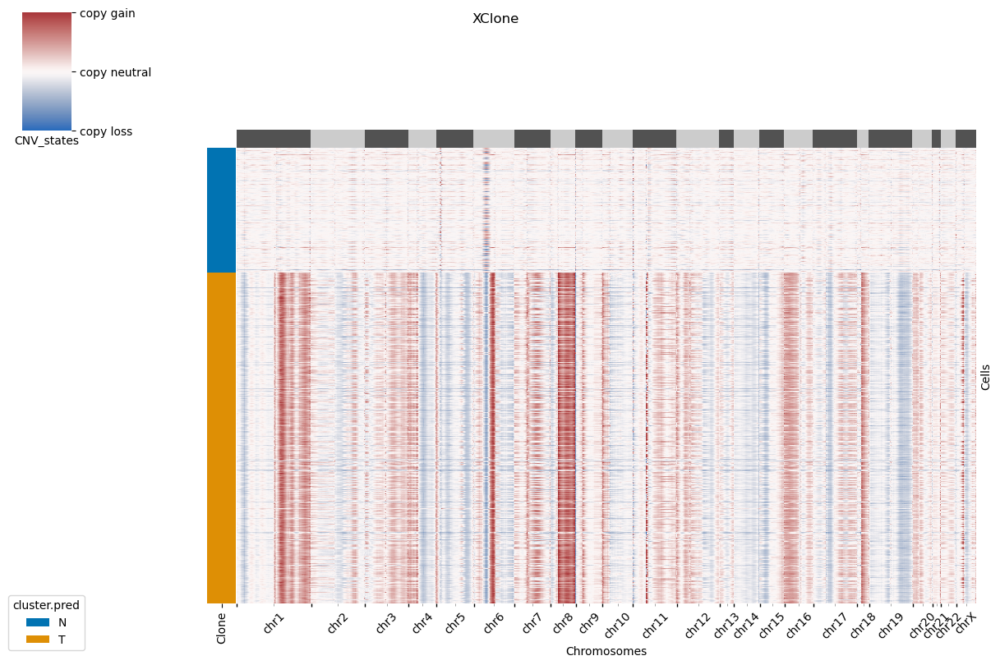

In [41]:
xclone.pl.smooth_visualization(RDR_adata, Xlayer = "RDR_smooth", cell_anno_key = 'cluster.pred', 
                   vmin=-0.7, vmax=0.7)

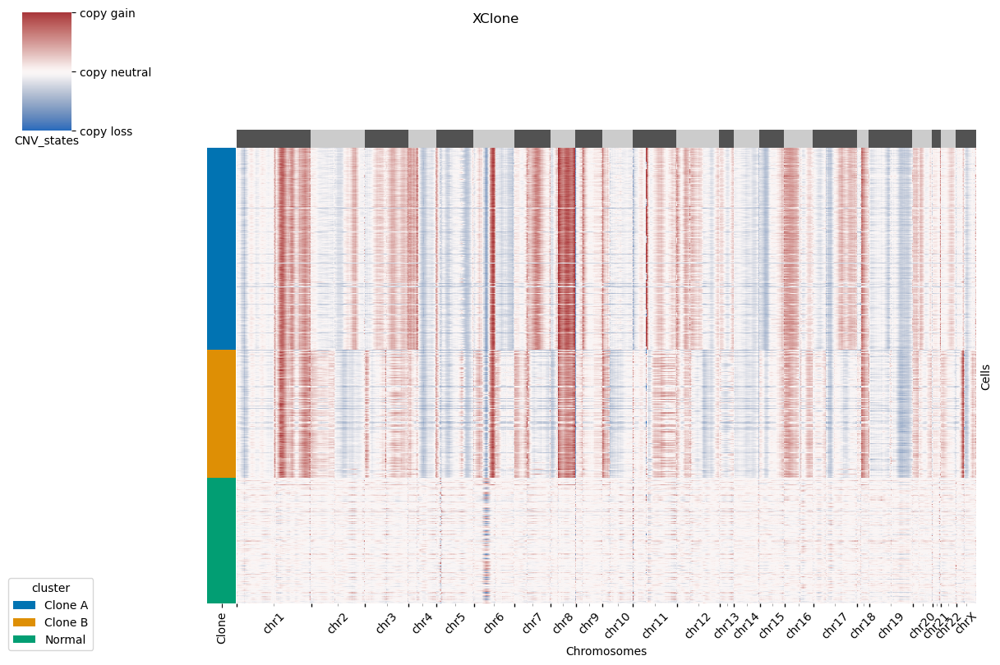

In [42]:
xclone.pl.smooth_visualization(RDR_adata, Xlayer = "RDR_smooth", cell_anno_key = 'cluster', 
                   vmin=-0.7, vmax=0.7 )

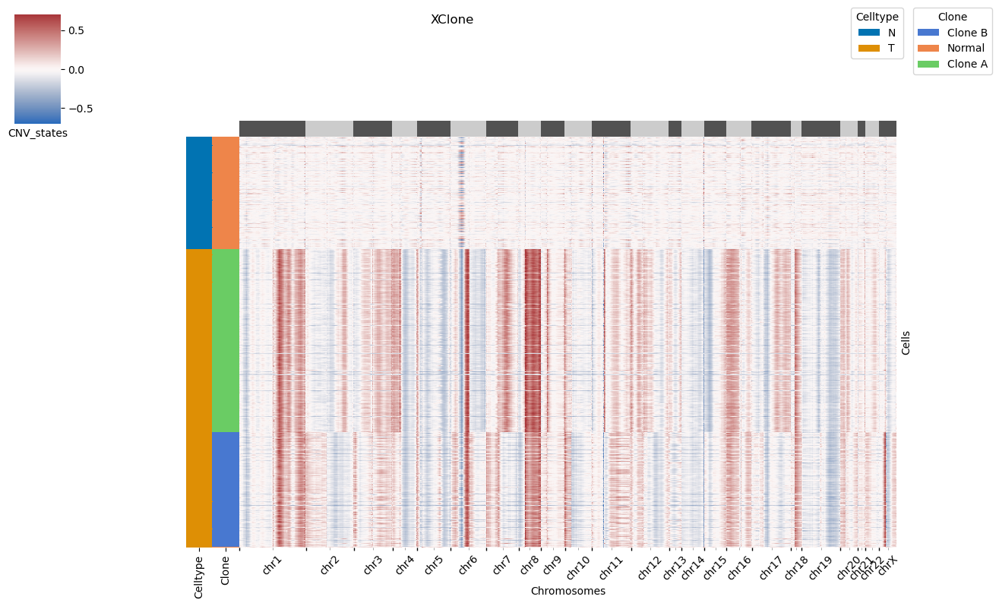

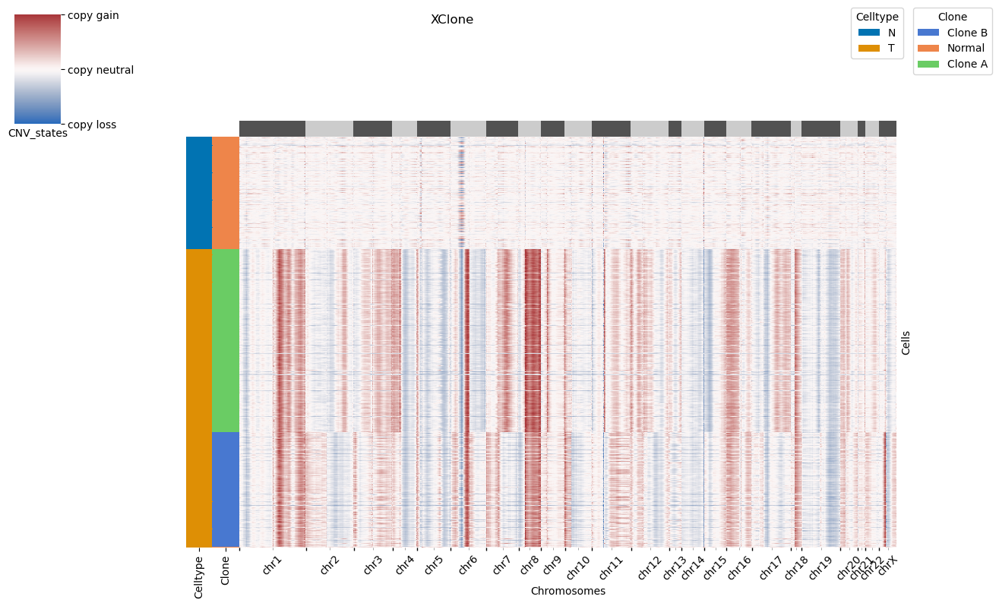

In [43]:
xclone.pl.smooth_visualization2(RDR_adata, Xlayer = "RDR_smooth", cell_anno_key = ['cluster.pred','cluster'], 
                   vmin=-0.7, vmax=0.7, change_colorbar = False, colorbar_ticks = None)
xclone.pl.smooth_visualization3(RDR_adata, Xlayer = "RDR_smooth", cell_anno_key = ['cluster.pred','cluster'], 
                   vmin=-0.7, vmax=0.7, save_file = True, out_file = rdr_smooth_fig)

[XClone] RDR CNV states chrs guiding(copy loss, copy neutral, copy gain): ['19q', '3p', '8q']
CNV loss:  0.6424092962391108


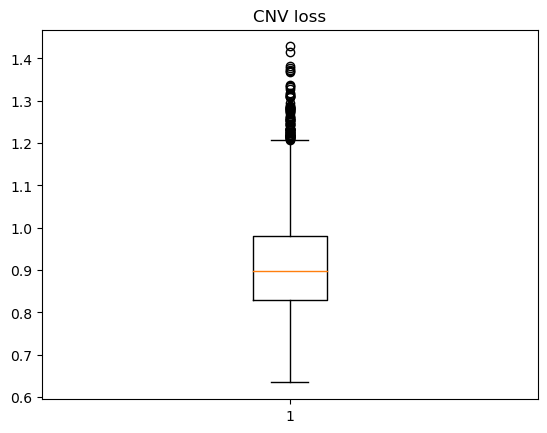

CNV neutral:  1.2354090610596011


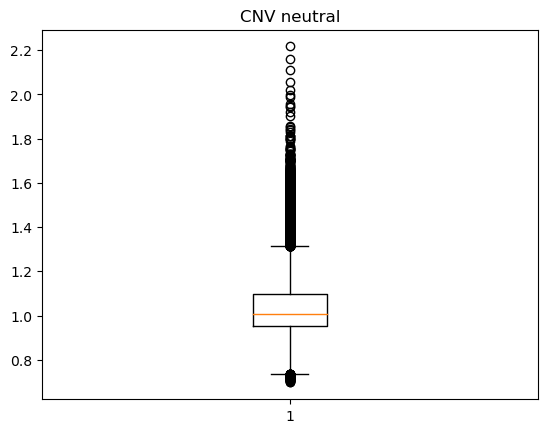

CNV gain:  2.904653922422906


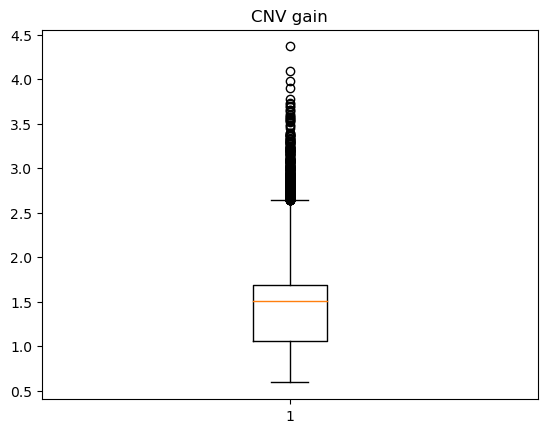

[XClone] RDR CNV states ratio guiding(copy loss, copy neutral, copy gain): [0.6424093  1.23540906 2.90465392]


array([0.6424093 , 1.23540906, 2.90465392])

In [72]:
# guide_chr_lst, anno_key = xclone.model.guide_CNV_chrs(RDR_adata, Xlayer = "RDR_smooth", anno_key = "chr")
# guide_cnv_ratio = xclone.model.guide_CNV_states(RDR_adata, Xlayer = "RDR_smooth", chr_lst = guide_chr_lst, anno_key = "chr", qt_lst = [0.00001, 0.96, 0.999], show_boxplot = True)
# guide_cnv_ratio

guide_chr_lst, anno_key = xclone.model.guide_CNV_chrs(RDR_adata, Xlayer = "RDR_smooth", anno_key = "chr_arm")
guide_cnv_ratio = xclone.model.guide_CNV_states(RDR_adata, Xlayer = "RDR_smooth", chr_lst = guide_chr_lst, anno_key = "chr_arm", qt_lst = [0.00001, 0.96, 0.999], show_boxplot = True)
guide_cnv_ratio

In [73]:
RDR_adata = xclone.model.gene_exp_group(RDR_adata, n_group = gene_exp_group, verbose=True)

expression_brk [-0.6898304  4.6525674]


[XClone] CNV_optimazation iteration:  1
filter nan emm_prob
[XClone HMM smoothing] Time used: 28 seconds
[XClone] CNV_optimazation iteration:  2
[XClone] fit CNV ratio
26       2.910817
27       2.910817
38       2.910817
39       0.230897
43       0.144445
           ...   
33348    0.866876
33350    0.464328
33353    0.109098
33355    0.168195
33357    0.136160
Name: dispersion_capped, Length: 6397, dtype: float64
[XClone] GLM success:
[0. 0. 0. ... 0. 0. 2.] [1. 1. 1. ... 1. 1. 1.] [0.44933625 0.61273423 0.6205301  ... 0.64372521 0.74671358 0.81990984] [1. 1. 0. ... 0. 1. 0.]
[XClone] GLM success:
[0. 0. 0. ... 0. 0. 2.] [1. 1. 1. ... 1. 1. 1.] [0.44933625 0.61273423 0.6205301  ... 0.64372521 0.74671358 0.81990984] [0. 0. 1. ... 1. 0. 1.]
[XClone] GLM success:
[0. 0. 0. ... 0. 0. 2.] [1. 1. 1. ... 1. 1. 1.] [0.44933625 0.61273423 0.6205301  ... 0.64372521 0.74671358 0.81990984] [0. 0. 0. ... 0. 0. 0.]
Time used 4 seconds
filter nan emm_prob
[XClone HMM smoothing] Time used: 33 secon

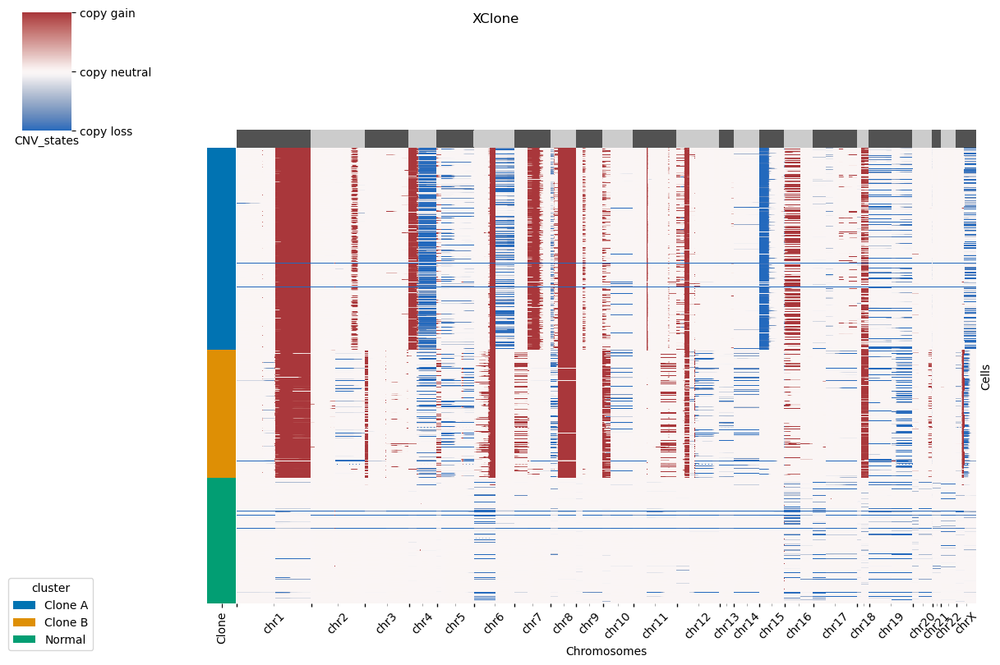

In [74]:
# RDR_adata = xclone.model.CNV_optimazation(RDR_adata, init_state_ratio = np.array([0.642, 1.232, 2.38]), 
#                     max_iter=2, 
#                     min_iter=1)
# xclone.pl.CNV_visualization(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = "cluster")
RDR_adata = xclone.model.CNV_optimazation(RDR_adata, init_state_ratio = guide_cnv_ratio, 
                    max_iter=2, 
                    min_iter=1)

xclone.pl.CNV_visualization(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = "cluster", save_file = True, out_file = rdr_final_fig)

In [75]:
## default 1 groups
RDR_adata.write(RDR_final_file)

### More exploration base on celltype cluster information

In [77]:
celltype_file = "/home/rthuang/ResearchProject/XClone/raw_data/TNBC1_data/tnbc1_celltype_diffresolution.txt"
RDR_adata = xclone.pp.extra_anno(RDR_adata, celltype_file, barcodes_key = "cell", 
                                   cell_anno_key = ["cell type1","cell type2", "cell type3", "cell type4", "cell type5", "cell type6" ], 
                                   sep ="\t")

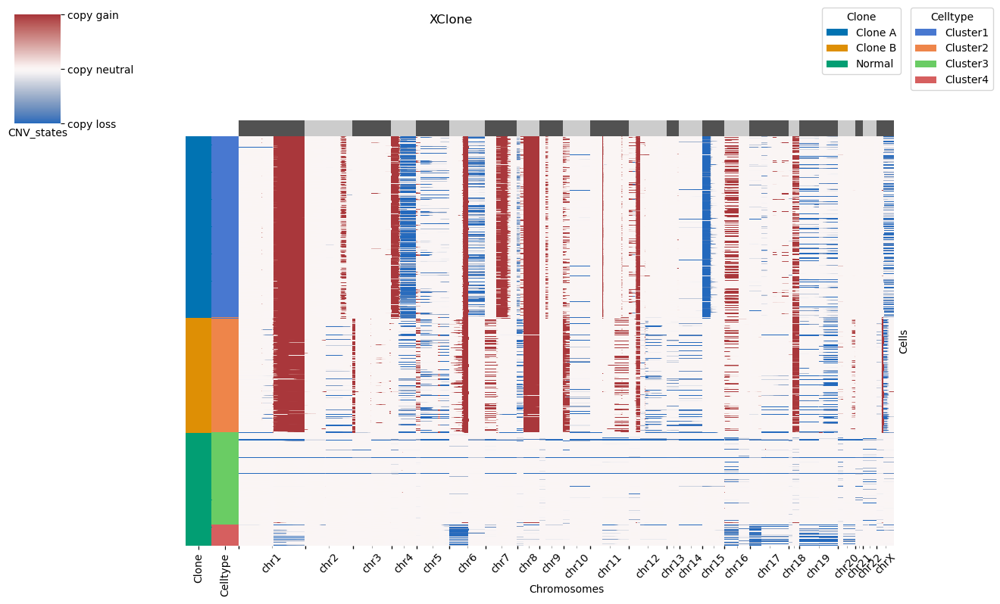

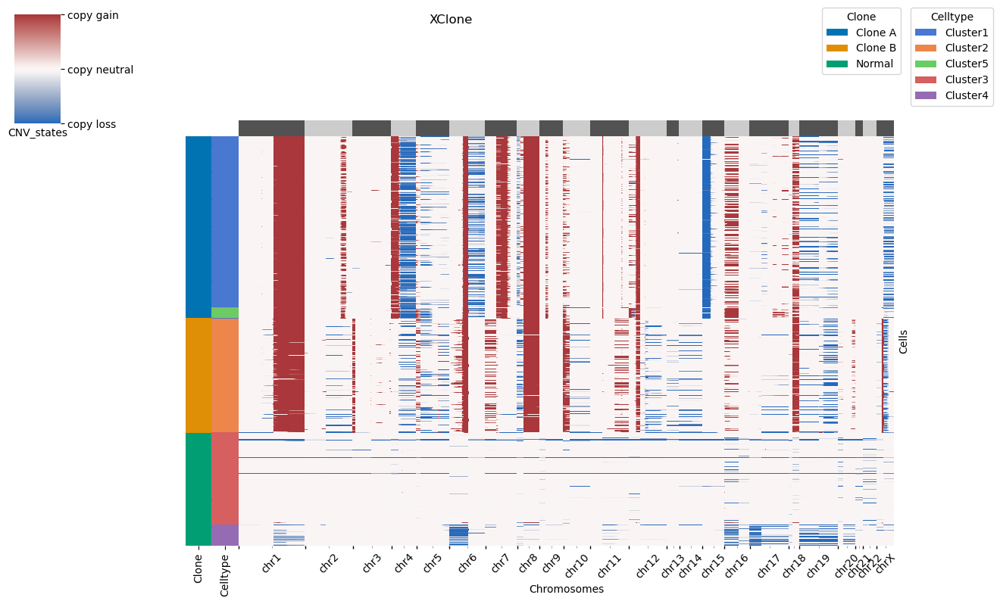

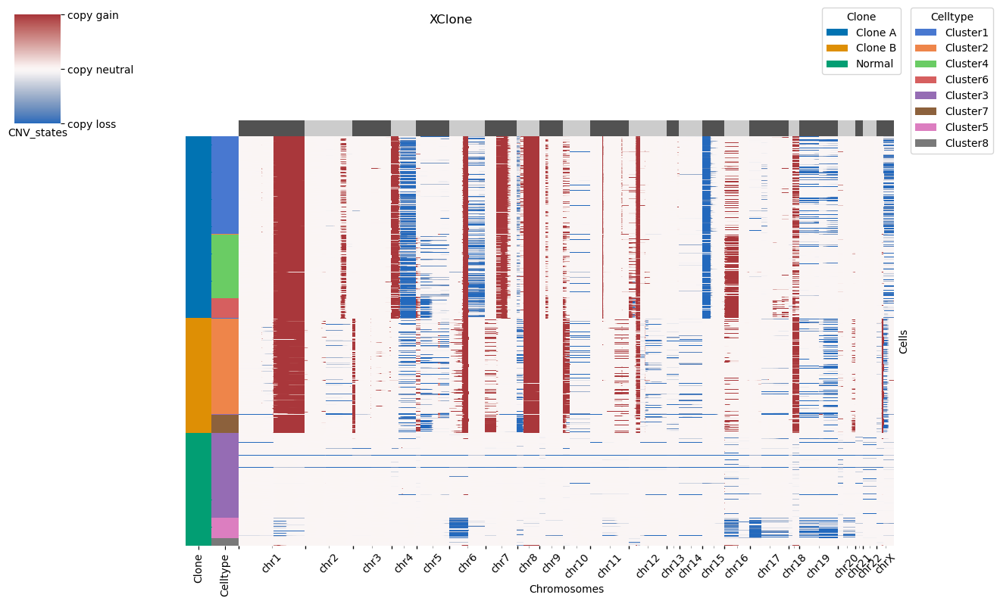

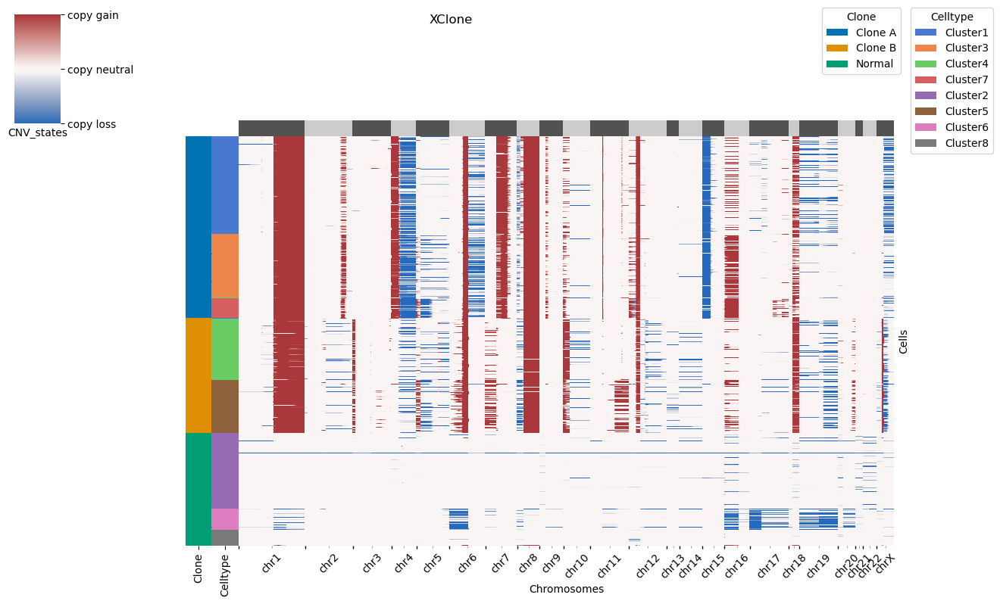

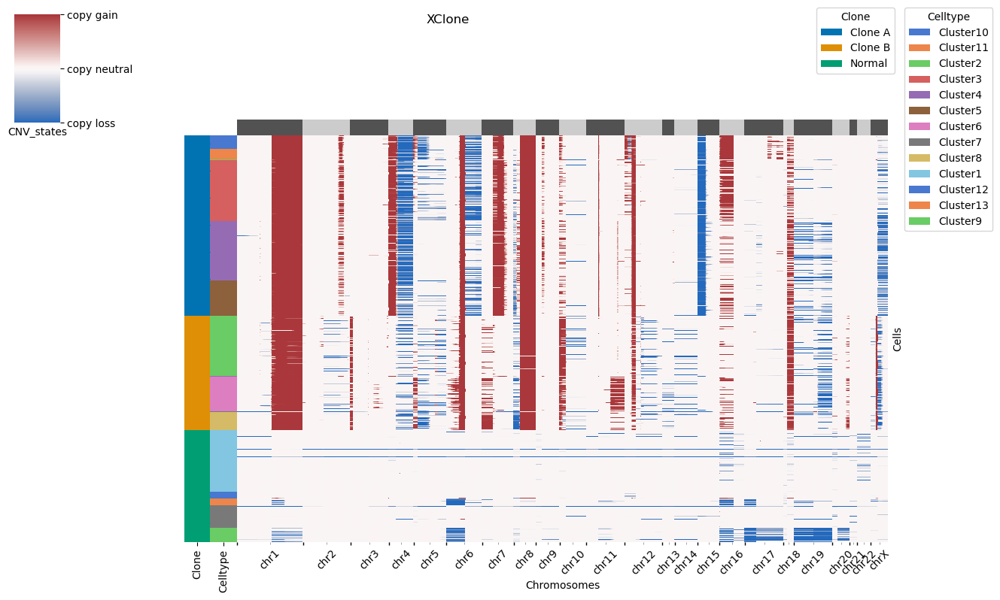

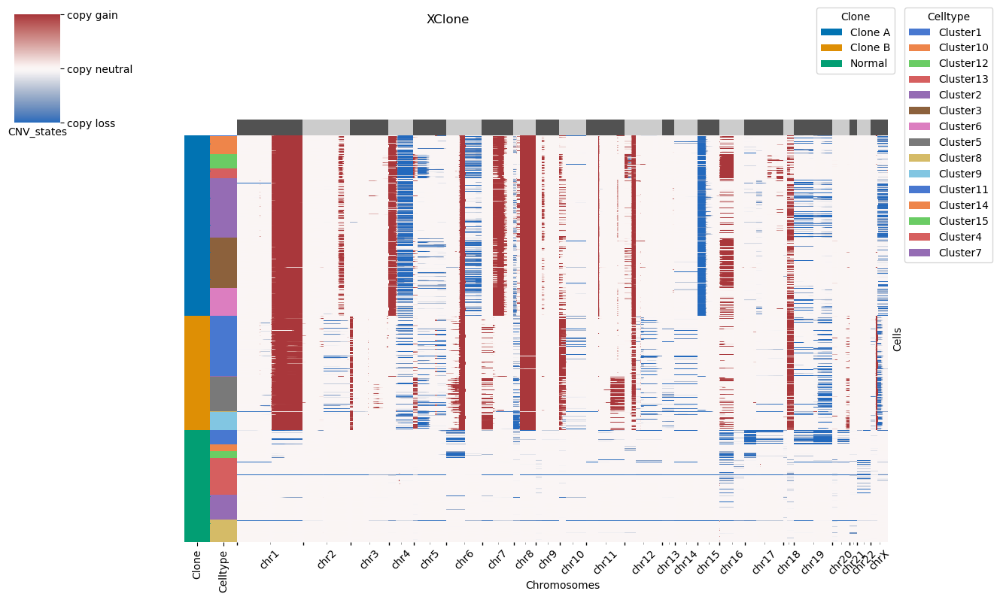

In [79]:
xclone.pl.CNV_visualization_complex(RDR_adata, cell_anno_key = ["cluster", "cell type1"])
xclone.pl.CNV_visualization_complex(RDR_adata, cell_anno_key = ["cluster", "cell type2"])
xclone.pl.CNV_visualization_complex(RDR_adata, cell_anno_key = ["cluster", "cell type3"])
xclone.pl.CNV_visualization_complex(RDR_adata, cell_anno_key = ["cluster", "cell type4"])
xclone.pl.CNV_visualization_complex(RDR_adata, cell_anno_key = ["cluster", "cell type5"])
xclone.pl.CNV_visualization_complex(RDR_adata, cell_anno_key = ["cluster", "cell type6"])

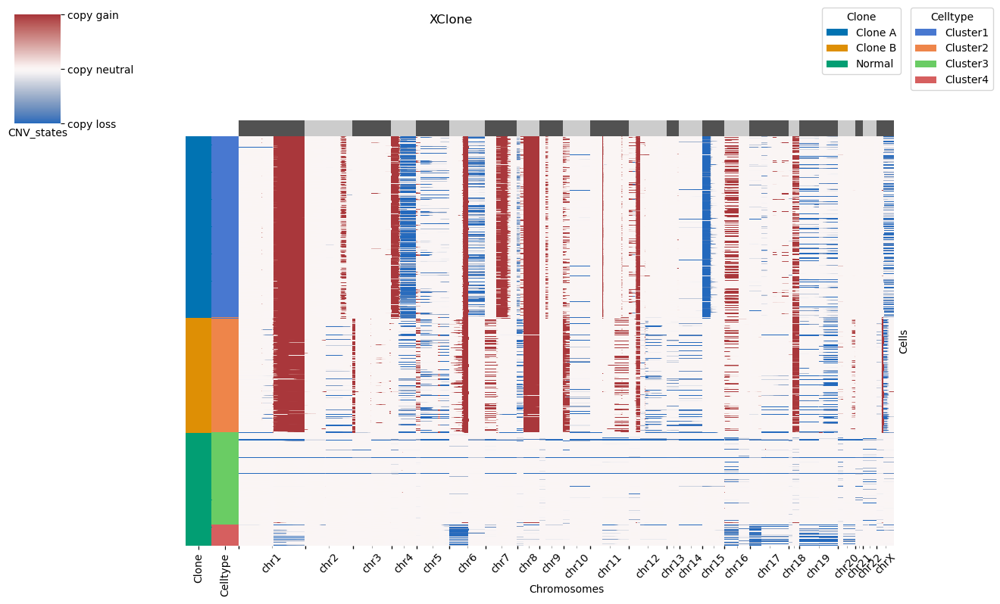

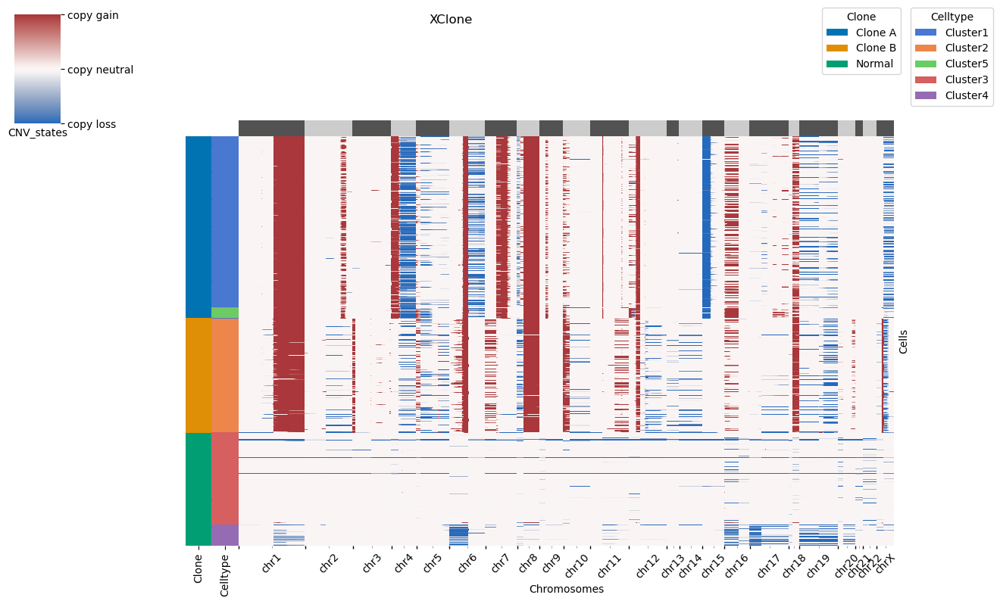

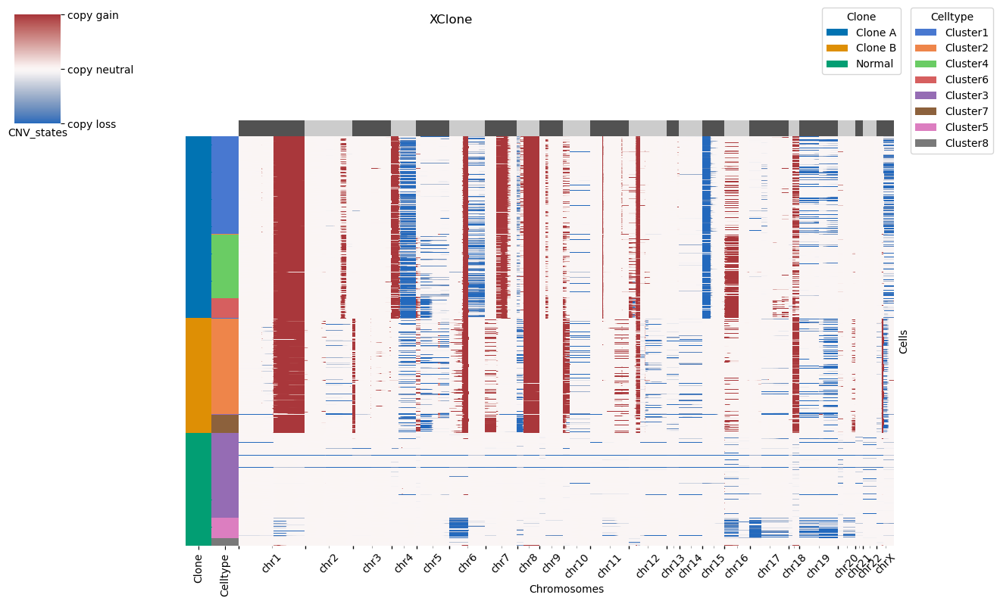

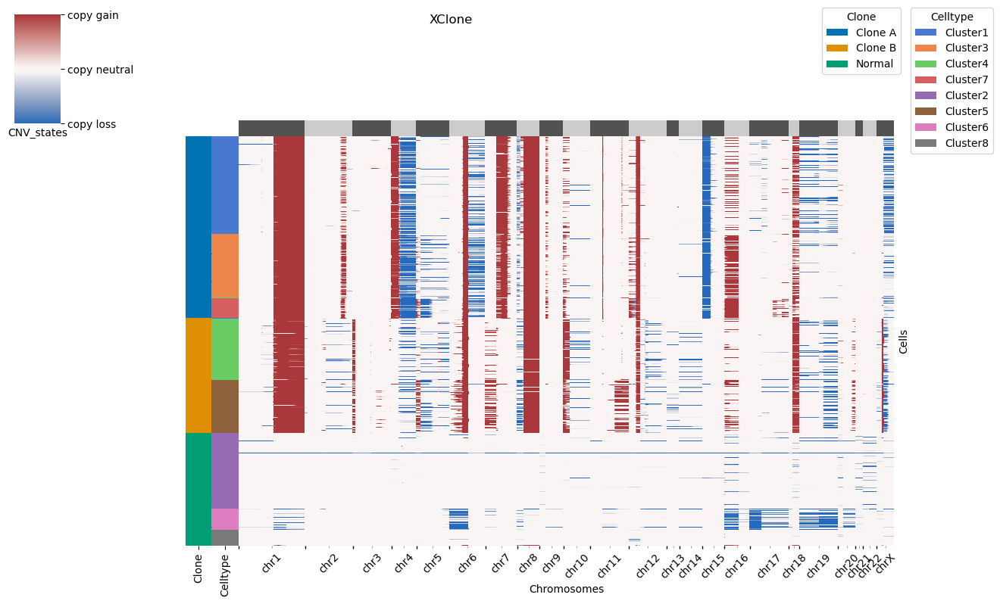

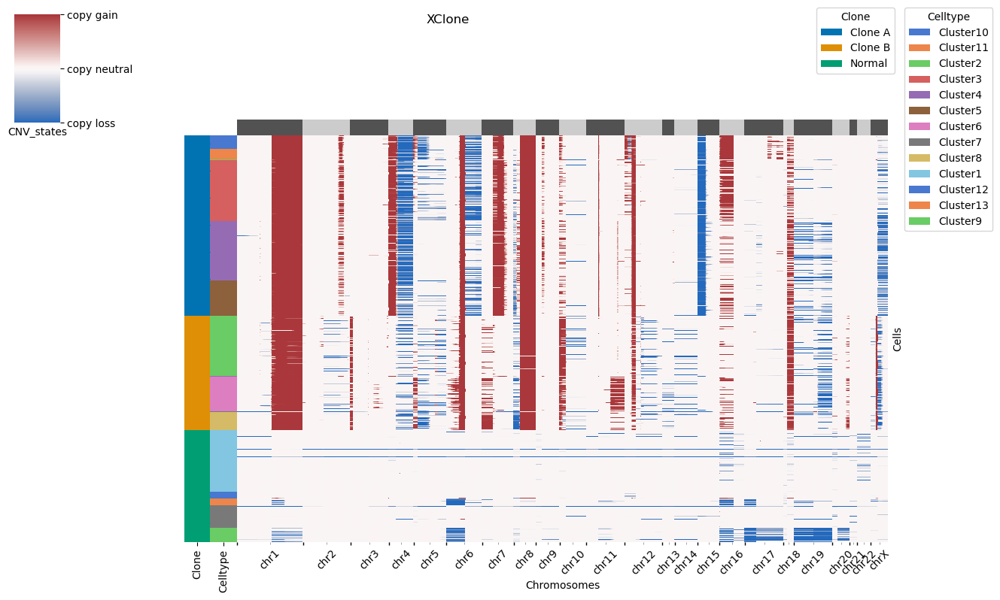

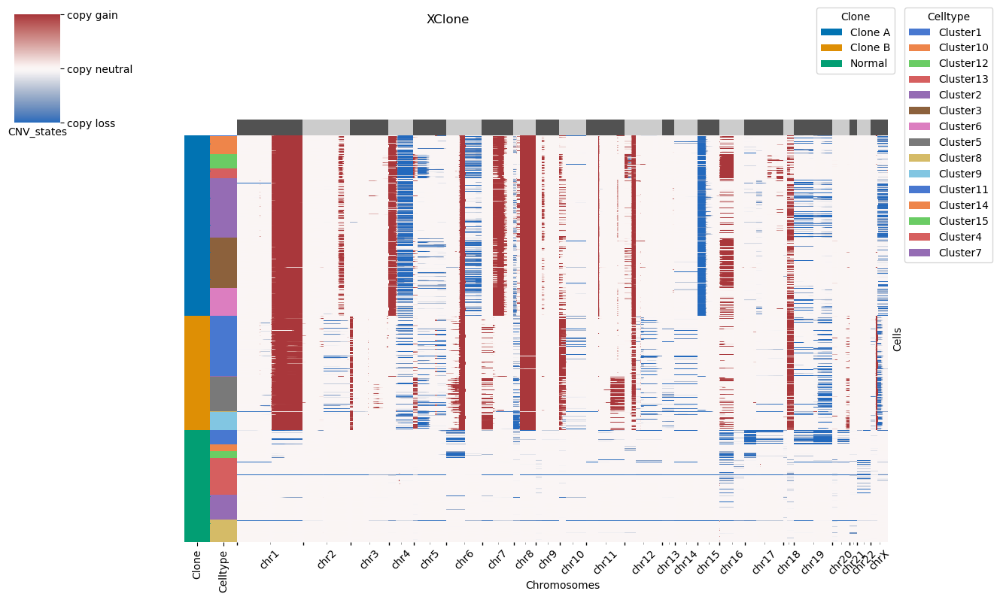

In [80]:
xclone.pl.CNV_visualization_complex(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = ["cluster", "cell type1"])
xclone.pl.CNV_visualization_complex(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = ["cluster", "cell type2"])
xclone.pl.CNV_visualization_complex(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = ["cluster", "cell type3"])
xclone.pl.CNV_visualization_complex(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = ["cluster", "cell type4"])
xclone.pl.CNV_visualization_complex(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = ["cluster", "cell type5"])
xclone.pl.CNV_visualization_complex(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = ["cluster", "cell type6"])

### Exploration on mit

In [81]:
mit_file = "/home/rthuang/ResearchProject/XClone/raw_data/TNBC1_data/MQuad_mitclones_df.csv"
RDR_adata = xclone.pp.extra_anno(RDR_adata, mit_file, barcodes_key = "cell", 
                                   cell_anno_key = ["mit_clone_id"], 
                                   sep =",")

In [82]:
RDR_adata.obs["mit_clone_id"]

AAACCTGCACCTTGTC-1    0
AAACGGGAGTCCTCCT-1    0
AAACGGGTCCAGAGGA-1    0
AAAGATGCAGTTTACG-1    0
AAAGCAACAGGAATGC-1    0
                     ..
TTTATGCTCCTCATTA-1    0
TTTATGCTCTGTTGAG-1    0
TTTCCTCTCGGAAACG-1    0
TTTGCGCCAATCACAC-1    0
TTTGTCATCTTGTATC-1    0
Name: mit_clone_id, Length: 1097, dtype: category
Categories (2, int64): [0, 1]

In [83]:
clone2annotation = {
     0: 'Clone1',
     1: 'Clone2'}
RDR_adata.obs["mit_ID"] = RDR_adata.obs["mit_clone_id"].map(clone2annotation).astype('category')

In [84]:
RDR_adata.obs

,copykat.pred,cluster.pred,cluster,library_ratio,library_alpha,sample_chr_total,ref_chr_total,sample_chr_total_normalization,library_ratio_capped,counts_ratio,...,cell type2,cell type3,cell type4,cell type5,cell type6,mit_clone_id,confident,tumor,copykat,mit_ID
AAACCTGCACCTTGTC-1,T,T,Clone A,1.008691,1.354018,2772.0,4066.129395,0.681729,1.008691,1.013301,...,Cluster5,Cluster6,Cluster7,Cluster10,Cluster12,0,True,T,1,Clone1
AAACGGGAGTCCTCCT-1,N,N,Normal,0.653672,0.319059,2826.0,4509.245605,0.626712,0.653672,0.676202,...,Cluster3,Cluster3,Cluster2,Cluster1,Cluster4,0,True,N,2,Clone1
AAACGGGTCCAGAGGA-1,T,T,Clone A,1.177460,1.053450,3319.0,4066.129395,0.816255,1.177460,1.196331,...,Cluster1,Cluster1,Cluster1,Cluster4,Cluster2,0,True,T,1,Clone1
AAAGATGCAGTTTACG-1,T,T,Clone B,0.365469,3.018751,1814.0,4066.129395,0.446125,0.365469,0.655255,...,Cluster2,Cluster2,Cluster4,Cluster2,Cluster1,0,True,T,3,Clone1
AAAGCAACAGGAATGC-1,T,T,Clone A,0.701198,1.489378,2034.0,4066.129395,0.500230,0.701198,0.725594,...,Cluster1,Cluster1,Cluster1,Cluster5,Cluster6,0,True,T,1,Clone1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTATGCTCCTCATTA-1,T,T,Clone A,1.190337,1.441410,3420.0,4066.129395,0.841095,1.190337,1.304501,...,Cluster1,Cluster1,Cluster1,Cluster4,Cluster2,0,True,T,1,Clone1
TTTATGCTCTGTTGAG-1,T,T,Clone A,0.903312,1.520170,2446.0,4066.129395,0.601555,0.903312,0.865584,...,Cluster1,Cluster1,Cluster1,Cluster5,Cluster6,0,True,T,1,Clone1
TTTCCTCTCGGAAACG-1,T,T,Clone A,0.901396,1.361492,2454.0,4066.129395,0.603522,0.901396,0.909882,...,Cluster1,Cluster1,Cluster1,Cluster5,Cluster10,0,True,T,1,Clone1
TTTGCGCCAATCACAC-1,T,T,Clone A,3.206090,1.102217,9208.0,4066.129395,2.264561,3.206090,3.365787,...,Cluster1,Cluster4,Cluster3,Cluster3,Cluster3,0,True,T,1,Clone1


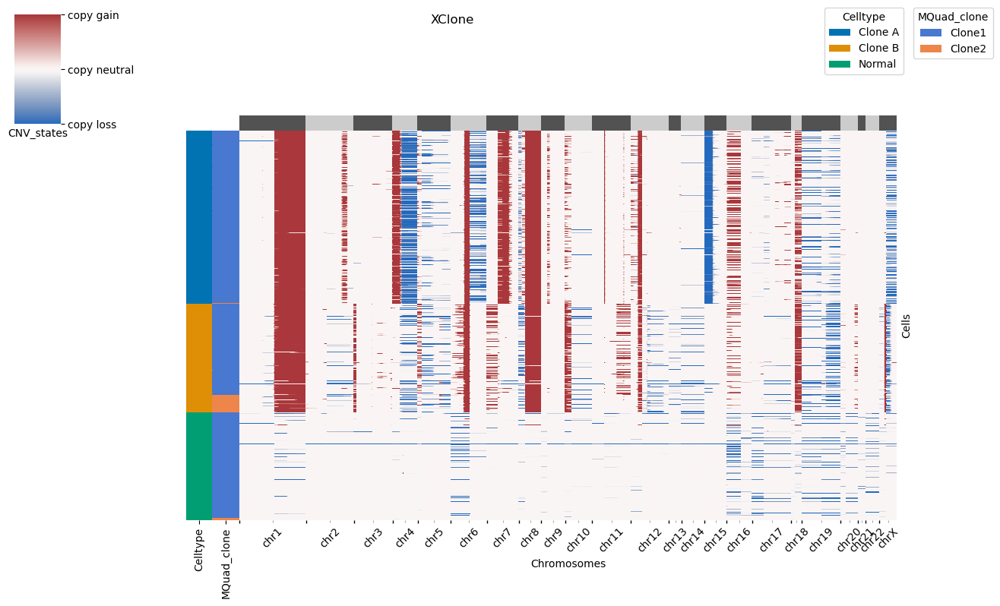

In [85]:
xclone.pl.CNV_visualization_complex(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = ["cluster", "mit_ID"], clusters_display_name = [ "Celltype", "MQuad_clone"])
# xclone.pl.CNV_visualization_complex(RDR_adata,  weights = False, cell_anno_key = [ "cell type4", "mit_ID"], clusters_display_name = [ "Celltype", "MQuad_clone"])

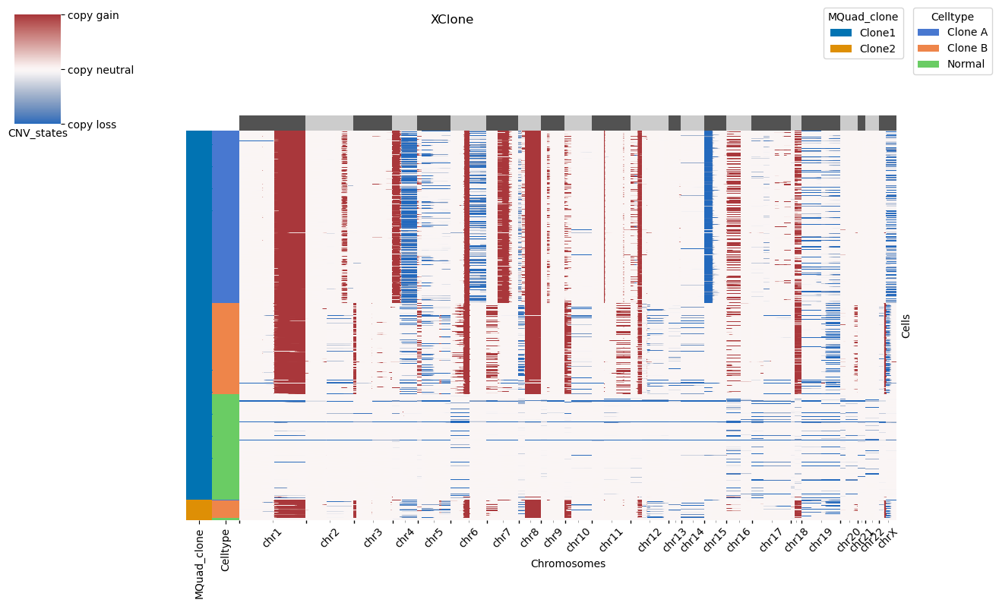

In [86]:
xclone.pl.CNV_visualization_complex(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = ["mit_ID", "cluster", ], clusters_display_name = [ "MQuad_clone","Celltype"], )

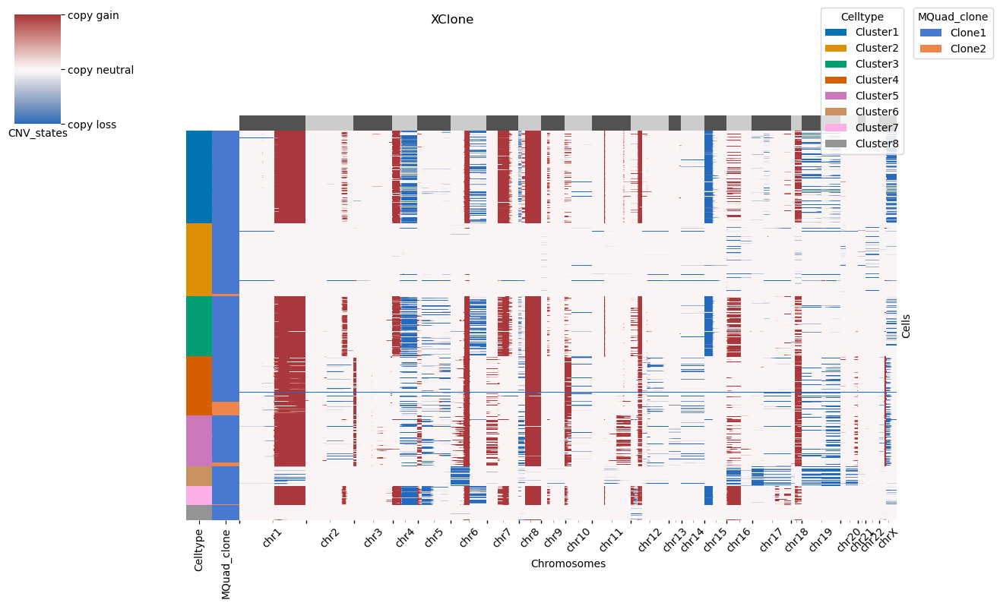

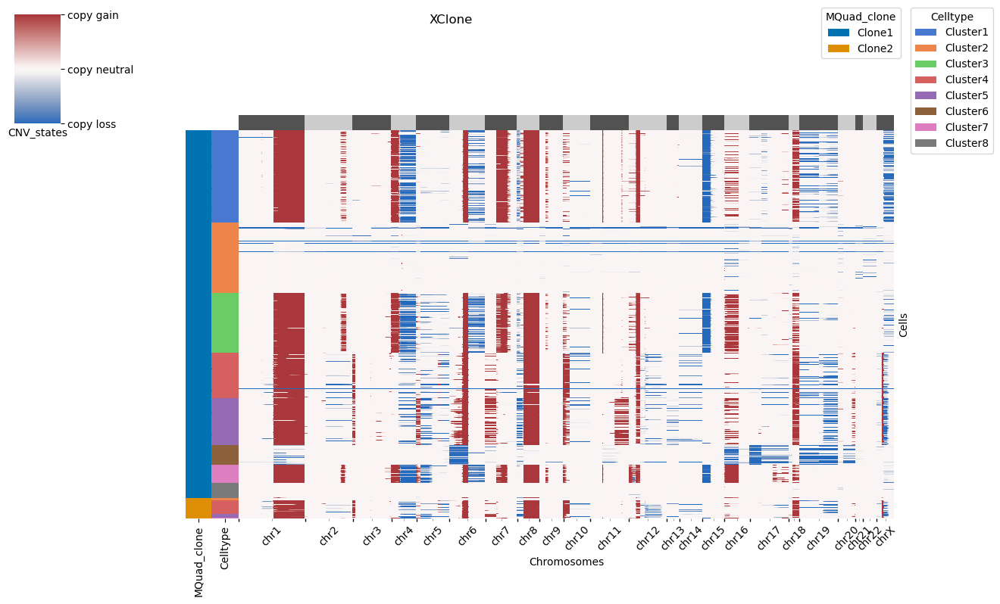

In [87]:
## pick this one
xclone.pl.CNV_visualization_complex(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = ["cell type4", "mit_ID"], clusters_display_name = [ "Celltype", "MQuad_clone"])

xclone.pl.CNV_visualization_complex(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = ["mit_ID", "cell type4"], clusters_display_name = [  "MQuad_clone", "Celltype"])

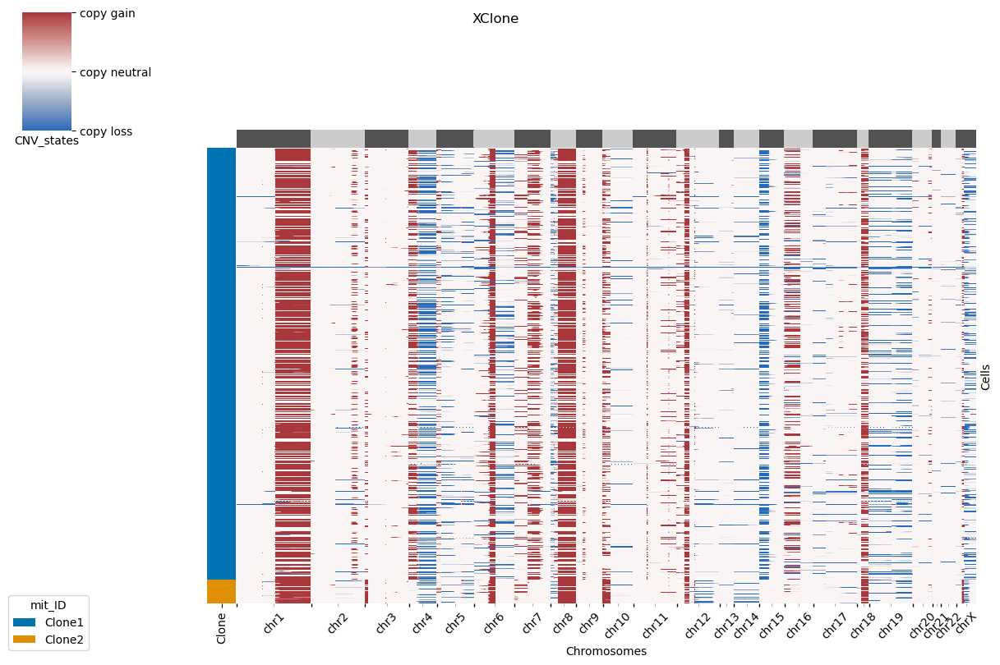

In [88]:
xclone.pl.CNV_visualization(RDR_adata, states_weight = np.array([1,2,3]), weights = True, cell_anno_key = "mit_ID")

In [91]:
RDR_adata.write(explore_RDR_file)

... storing 'tumor' as categorical


## Part III-Allele frequency  - BAF module

### params setting

In [170]:
## input and output dir
## files prepared
## params for this dataset

dataset_name = "TNBC1_scRNA"
dat_dir = '/storage/yhhuang/users/rthuang/processed_data/xcltk-new/TNBC1_071622/TNBC1-csp-phase-rna/phase-snp-feature/'
AD_file =  dat_dir + "resort_AD.mtx" # 'xcltk.AD.mtx'
DP_file = dat_dir +  "resort_DP.mtx" # 'xcltk.DP.mtx'
mtx_barcodes_file = dat_dir + "xcltk.samples.use.tsv"

## extra annotation data
anno_file = "/home/rthuang/ResearchProject/XClone/raw_data/TNBC1_data/tnbc1_TN.txt"
seurat_results_file = "/home/rthuang/ResearchProject/XClone/raw_data/TNBC1_data/seurat-tnbc-3cluster-id.txt"

## params
genome_mode = "hg38_genes"
## output
out_dir = "/storage/yhhuang/users/rthuang/xclone/manuscript/TNBC1_scRNA/data/"
fig_dir = "/storage/yhhuang/users/rthuang/xclone/manuscript/TNBC1_scRNA/plot/"

xclone.al.dir_make(out_dir)
xclone.al.dir_make(fig_dir)

# output before CNV calling
BAF_base_file = out_dir + "BAF_base_Xdata.h5ad"
BAF_merge_base_file = out_dir + "BAF_merge_base_Xdata.h5ad"

# output after CNV calling

# default 1
BAF_final_file = out_dir + "BAF_merge_Xdata_KNN_HMM_post.h5ad"

explore_BAF_file = out_dir +"BAF_merge_Xdata_KNN_HMM_post_explore.h5ad"


# default:XClone
fig_title = ""

baf_smooth_fig = fig_dir + dataset_name + "_BAF_smooth.png"
baf_final_fig = fig_dir + dataset_name + "_BAF_CNV.png"

## use RDR connectivities
RDR_final_file = out_dir + "RDR_adata_KNN_HMM_post.h5ad"

### III-I: load data and check validation

In [97]:
BAF_adata = xclone.pp.xclonedata([AD_file, DP_file], 'BAF', mtx_barcodes_file, genome_mode = "hg38_genes")
BAF_adata = xclone.pp.extra_anno(BAF_adata, anno_file, barcodes_key = "cell", cell_anno_key = "cluster.pred", sep ="\t")
## add the second annotation
BAF_adata = xclone.pp.extra_anno(BAF_adata, seurat_results_file, barcodes_key = "cell", cell_anno_key = "cluster", sep ="\t")

In [98]:
BAF_adata

AnnData object with n_obs × n_vars = 1097 × 33472
    obs: 'copykat.pred', 'cluster.pred', 'cluster'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes'
    layers: 'AD', 'DP'

In [99]:
BAF_adata = xclone.pp.check_BAF(BAF_adata, cell_anno_key = "cluster.pred", verbose = True)

[XClone data preprocessing] check BAF raw dataset value: success
Keep valid cells: Filter out 0 cells / 1097 total cells, remain 1097 valid cells with annotation
[XClone data preprocessing] check BAF cell annotation: success


In [100]:
BAF_adata

AnnData object with n_obs × n_vars = 1097 × 33472
    obs: 'copykat.pred', 'cluster.pred', 'cluster'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes'
    layers: 'AD', 'DP'

#### check validated RDR and BAF

In [101]:
import anndata as an
# load preprocessed dataset
RDR_adata = an.read_h5ad(RDR_final_file)
xclone.pp.check_RDR_BAF_cellorder(RDR_adata, BAF_adata)

[XClone data checking]: RDR and BAF in same cell order


True

#### Remove marker genes

In [102]:
marker_genes = RDR_adata.uns["rank_marker_genes"]
BAF_adata = xclone.pp.Xdata_region_selection(BAF_adata,
                           select = False,
                           chr_anno_key = "GeneName",
                           chr_lst = marker_genes,
                           update_uns = False,
                           uns_anno_key = None)

[XClone-data removing]:
Filter out 30 genes / 33472 total genes, remain 33442 regions


In [103]:
BAF_adata

AnnData object with n_obs × n_vars = 1097 × 33442
    obs: 'copykat.pred', 'cluster.pred', 'cluster'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band'
    uns: 'log', 'data_mode', 'genome_mode', 'data_notes'
    layers: 'AD', 'DP'

## III-II: BAF Phasing

In [104]:
BAF_adata, merge_Xdata =  xclone.model.BAF_Local_phasing(BAF_adata, region_key = "chr", phasing_len = 100, bin_nproc=20)

[XClone-Local_phasing] time_used: 28.58seconds


In [105]:
BAF_adata, merge_Xdata = xclone.model.BAF_Global_phasing(BAF_adata, merge_Xdata)

[XClone-Global_phasing] time_used: 2.23seconds


In [106]:
BAF_adata.write(BAF_base_file)
merge_Xdata.write(BAF_merge_base_file)

... storing 'copykat.pred' as categorical
... storing 'chr' as categorical
... storing 'arm' as categorical
... storing 'chr_arm' as categorical
... storing 'band' as categorical
... storing 'copykat.pred' as categorical
... storing 'chr' as categorical
... storing 'arm' as categorical
... storing 'chr_arm' as categorical
... storing 'band' as categorical
... storing 'bin_stop_arm' as categorical
... storing 'bin_stop_chr_arm' as categorical
... storing 'bin_stop_band' as categorical


### check coverage

In [107]:
merge_Xdata.var[(merge_Xdata.layers["dp_bin"].A.sum(axis=0) == 0)]

,chr,start,stop,arm,chr_arm,band,gene1_stop,bin_stop_arm,bin_stop_chr_arm,bin_stop_band,bin_idx,bin_idx_cum,GeneName_lst,GeneID_lst,bin_genes_cnt
3103,1,247639749,248919946,q,1q,q44,247747062,q,1q,q44,31,31,"[AL390860.1, OR13G1, OR6F1, AC118470.1, OR14A2...","[ENSG00000235749, ENSG00000197437, ENSG0000016...",49
4053,2,89176328,96858095,p,2p,p11.2,89177160,q,2q,q11.2,9,41,"[IGKV2-24, IGKV3-25, IGKV2-26, IGKV1-27, IGKV2...","[ENSG00000241294, ENSG00000253202, ENSG0000025...",100
19006,11,133908564,135075899,q,11q,q25,133956985,q,11q,q25,19,196,"[IGSF9B, AP000911.3, AP000911.1, AP000911.2, J...","[ENSG00000080854, ENSG00000255406, ENSG0000020...",19
21554,14,21653835,22513998,q,14q,q11.2,21667642,q,14q,q11.2,1,223,"[OR4E2, OR4E1, TRAV2, AC243972.1, TRAV3, TRAV4...","[ENSG00000221977, ENSG00000276240, ENSG0000021...",100
22654,14,105472962,106331563,q,14q,q32.33,105480170,q,14q,q32.33,12,234,"[CRIP2, CRIP1, AL928654.3, TEDC1, TMEM121, IGH...","[ENSG00000182809, ENSG00000213145, ENSG0000025...",100
22754,14,106335082,106879812,q,14q,q32.33,106335613,q,14q,q32.33,13,235,"[IGHV3-30, IGHVII-30-1, IGHV3-30-2, IGHV4-31, ...","[ENSG00000270550, ENSG00000253491, ENSG0000025...",85
30061,19,58561931,58599355,q,19q,q13.43,58573575,q,19q,q13.43,20,310,"[MZF1, AC016629.2]","[ENSG00000099326, ENSG00000269600]",2
31458,21,46635167,46665124,q,21q,q22.3,46665124,q,21q,q22.3,5,325,[PRMT2],[ENSG00000160310],1
32596,X,48255317,53170914,p,Xp,p11.23,48267444,p,Xp,p11.22,3,338,"[SSX1, AL606490.3, SSX3, SSX4, SSX4B, SLC38A5,...","[ENSG00000126752, ENSG00000230100, ENSG0000016...",100
33372,Y,2786855,25733388,p,Yp,p11.2,2787699,q,Yq,q11.23,0,346,"[SRY, RPS4Y1, AC006157.1, ZFY, ZFY-AS1, LINC00...","[ENSG00000184895, ENSG00000129824, ENSG0000027...",100


### Check phasing performance

In [108]:
merge_Xdata = xclone.pl.calculate_cell_BAF(merge_Xdata, AD_key = "ad_bin1", DP_key = "dp_bin", BAF_key = "BAF")
merge_Xdata = xclone.pl.calculate_cell_BAF(merge_Xdata, AD_key = "ad_bin1_phased", DP_key = "dp_bin", BAF_key = "BAF_phased")

AnnData object with n_obs × n_vars = 1097 × 347
    obs: 'copykat.pred', 'cluster.pred', 'cluster'
    var: 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'gene1_stop', 'bin_stop_arm', 'bin_stop_chr_arm', 'bin_stop_band', 'bin_idx', 'bin_idx_cum', 'GeneName_lst', 'GeneID_lst', 'bin_genes_cnt'
    uns: 'GeneName_lst', 'GeneID_lst', 'local_phasing_key', 'local_phasing_len'
    layers: 'ad_bin', 'ad_bin1', 'dp_bin', 'ad_bin_phased', 'ad_bin1_phased', 'BAF', 'BAF_phased', 'fill_BAF_phased', 'BAF_phased_KNN', 'BAF_phased_WMA', 'BAF_phased_KNN_WMA'
    obsp: 'connectivities_expr'

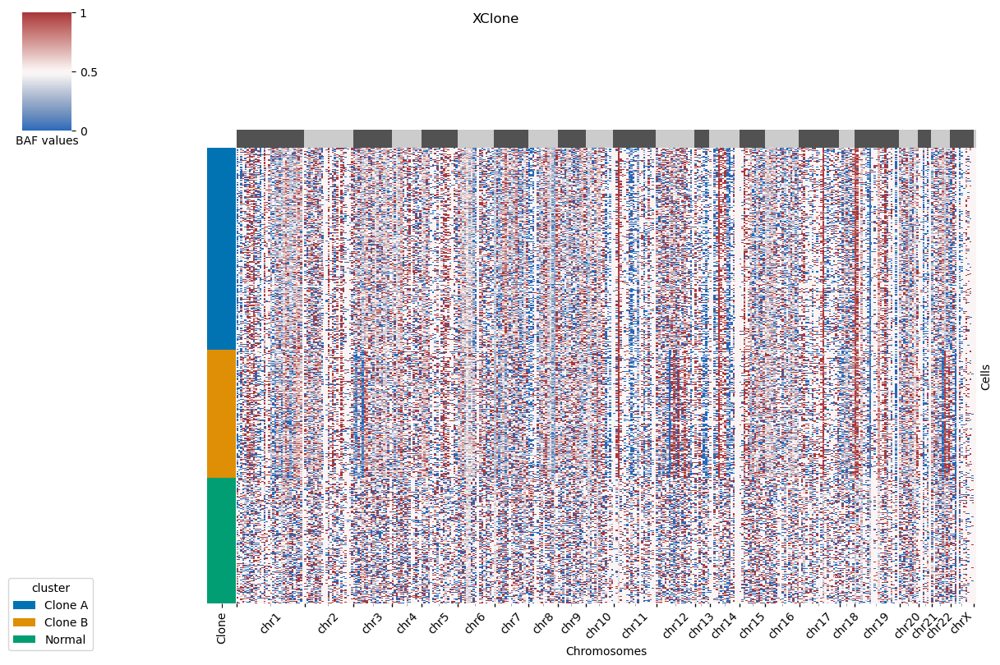

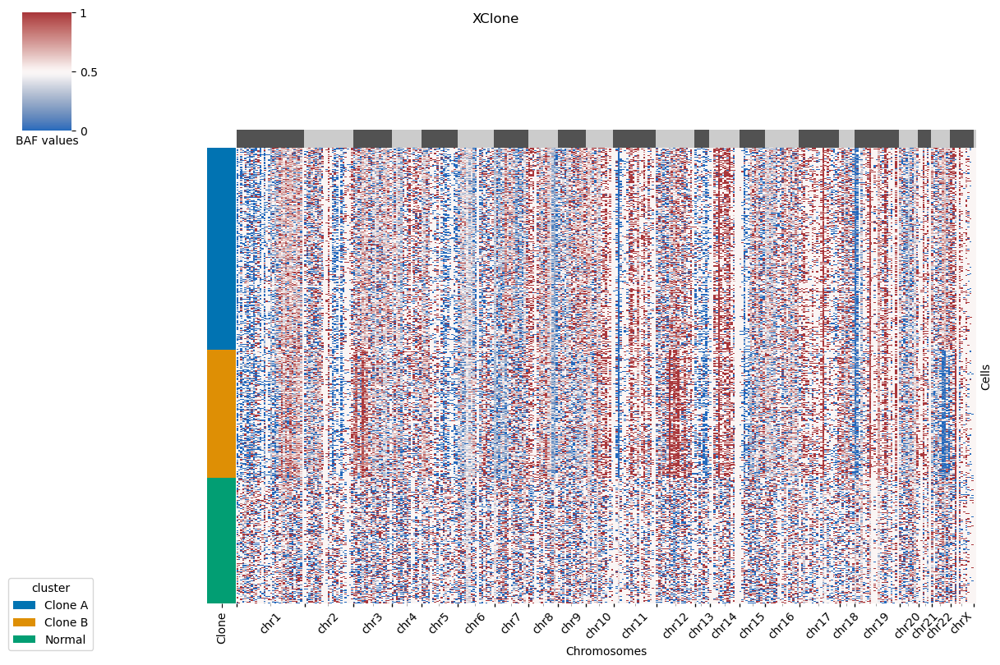

In [125]:
xclone.model.BAF_fillna(merge_Xdata, Xlayer = "BAF_phased", out_layer = "fill_BAF_phased")
xclone.pl.visualize_cell_BAF(merge_Xdata, Xlayer = "BAF", cell_anno_key = "cluster") 
xclone.pl.visualize_cell_BAF(merge_Xdata, Xlayer = "fill_BAF_phased", cell_anno_key = "cluster") 

### III-III -Smoothing

In [115]:
merge_Xdata = xclone.model.get_KNN_connectivities_from_expr(merge_Xdata, RDR_adata)

In [126]:
merge_Xdata = xclone.model.KNN_smooth(merge_Xdata, run_KNN = False, KNN_Xlayer=None, KNN_connect_use = "connectivities_expr", 
                                      layer = "fill_BAF_phased", out_layer='BAF_phased_KNN')
merge_Xdata = xclone.model.WMA_smooth(merge_Xdata, layer="fill_BAF_phased", out_layer='BAF_phased_WMA', window_size = 101, verbose=False)
merge_Xdata = xclone.model.KNN_smooth(merge_Xdata, KNN_connect_use = "connectivities_expr", layer="BAF_phased_WMA", out_layer='BAF_phased_WMA_KNN')
merge_Xdata = xclone.model.WMA_smooth(merge_Xdata, layer="BAF_phased_KNN", out_layer='BAF_phased_KNN_WMA', window_size = 101, verbose=False)

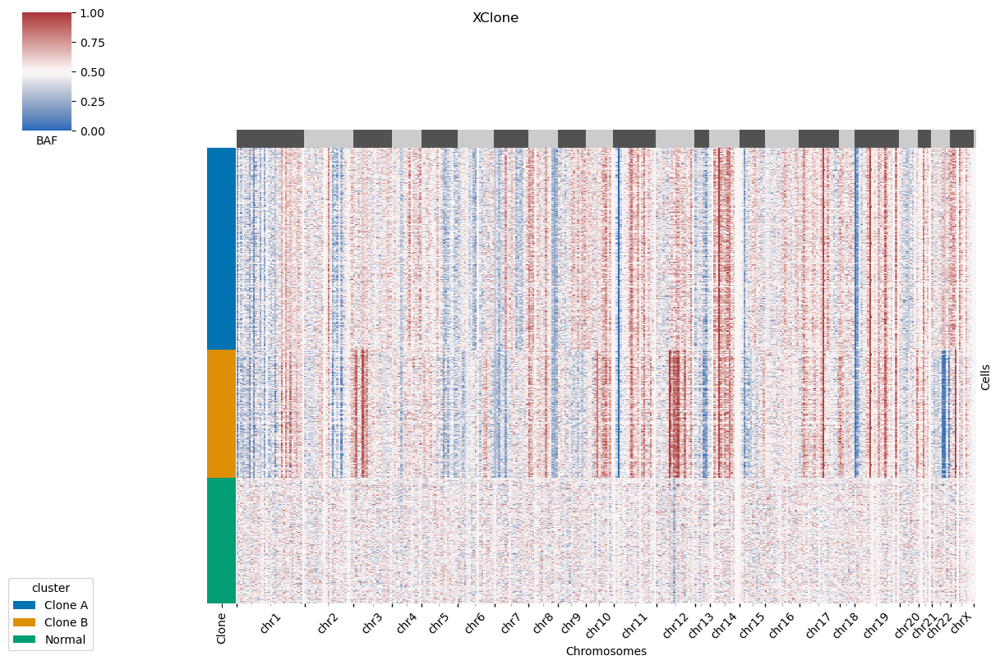

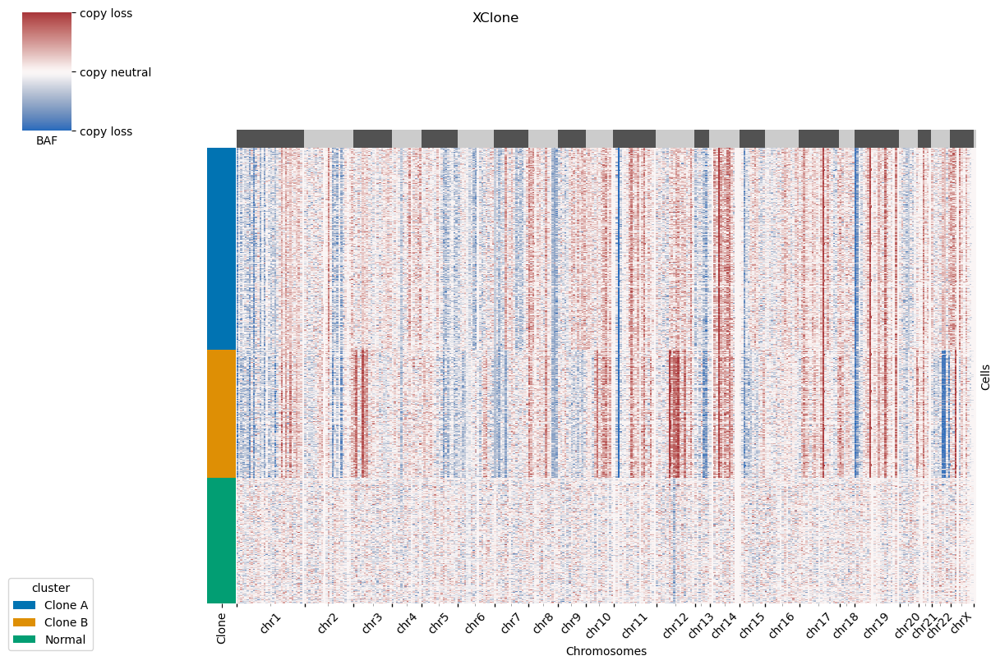

In [127]:
xclone.pl.BAF_smooth_visualization(merge_Xdata, Xlayer = "BAF_phased_KNN", cell_anno_key="cluster", change_colorbar = False, colorbar_name = "BAF")
xclone.pl.BAF_smooth_visualization(merge_Xdata, Xlayer = "BAF_phased_KNN", cell_anno_key="cluster", colorbar_ticks = [0, 0.5, 1], 
            colorbar_label = ["copy loss",  "copy neutral",  "copy loss"], colorbar_name = "BAF")

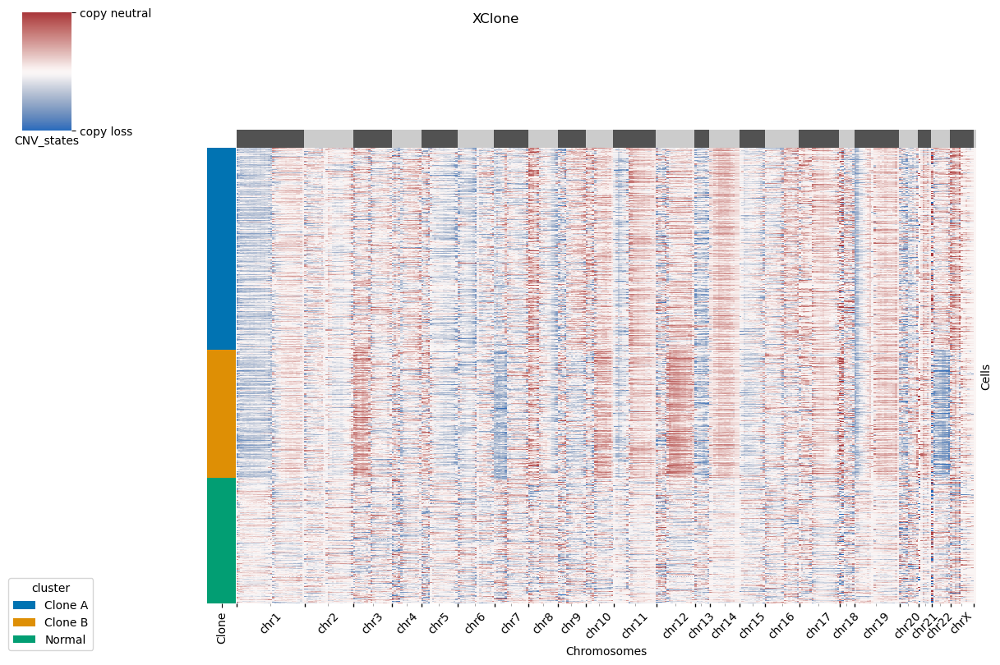

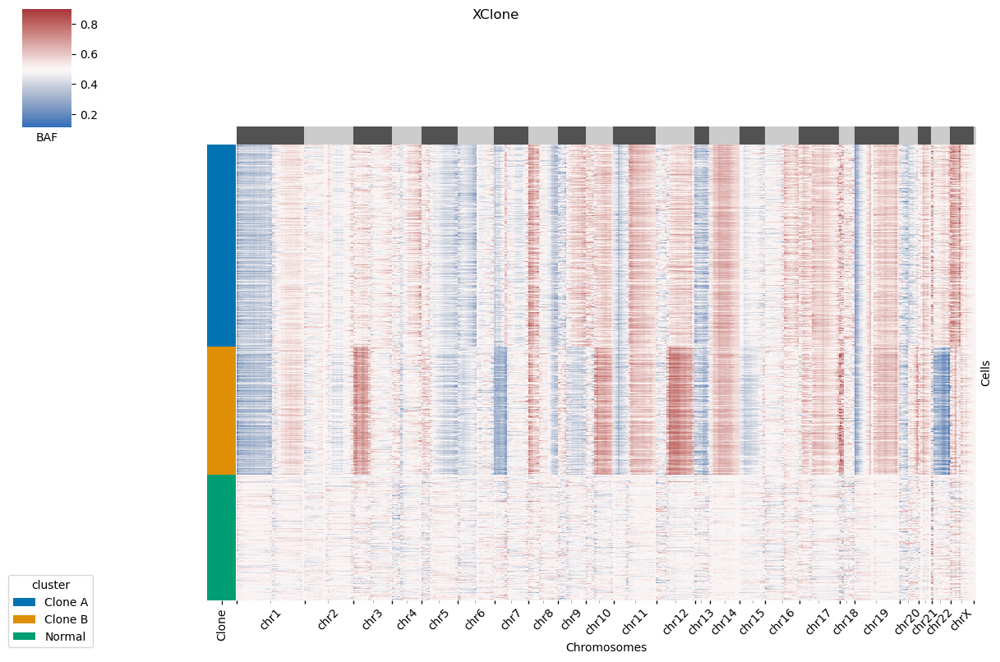

In [129]:
xclone.pl.BAF_smooth_visualization(merge_Xdata, Xlayer = "BAF_phased_WMA", cell_anno_key = "cluster")
xclone.pl.BAF_smooth_visualization(merge_Xdata, Xlayer = "BAF_phased_KNN_WMA", cell_anno_key = "cluster", change_colorbar = False, colorbar_name = "BAF",save_file = True, out_file = baf_smooth_fig)

In [130]:
BAF_adata.write(BAF_base_file)
merge_Xdata.write(BAF_merge_base_file)

### III-IV-Beat binomial mixture modelling and HMM smoothing

#### GMM for CNV states guidance

In [131]:
CNV_states = xclone.model.get_CNV_states(merge_Xdata, Xlayer = "BAF_phased_WMA", 
                   n_components = 3, 
                   means_init = None,
                   max_iter = 200)
CNV_states

guide_theo_states = xclone.model.guide_BAF_theo_states(CNV_states)

[XClone get_CNV_states] time_used: 24.14seconds


array([[0.50839325],
       [0.65726365],
       [0.3448917 ]])

In [132]:
guide_theo_states

array([0.3448917 , 0.65726365])

### HMM smoothing 

In [133]:
merge_Xdata = xclone.model.get_BAF_ref(merge_Xdata, Xlayer = "fill_BAF_phased", out_anno = "ref_BAF_phased", 
                anno_key = "cluster", ref_cell = "Normal")
merge_Xdata = xclone.model.get_BAF_ref(merge_Xdata, Xlayer = "fill_BAF_phased", out_anno = "ref_BAF_phased_clipped", 
                anno_key = "cluster", ref_cell = "Normal", clipping = True)

do clipping at ref BAF


states used: [[0.3448917  0.49619205 0.65726365]
 [0.3448917  0.48427152 0.65726365]
 [0.3448917  0.52790397 0.65726365]
 ...
 [0.3448917  0.50331126 0.65726365]
 [0.3448917  0.49668874 0.65726365]
 [0.3448917  0.5        0.65726365]]
[XClone] specific Center states used.
[XClone]: validated probability, all finite.
cal emm prob time 0 seconds
normalize the input emm_prob_log
normalized emm_prob_log
generate new layer key value: bin_phased_BAF_specific_center_emm_prob_log_KNN
[BAF smoothing] time_used: 0.14seconds
filter nan emm_prob
[XClone] multiprocessing for each brk item
nproc: 80
[XClone HMM smoothing] Time used: 4 seconds


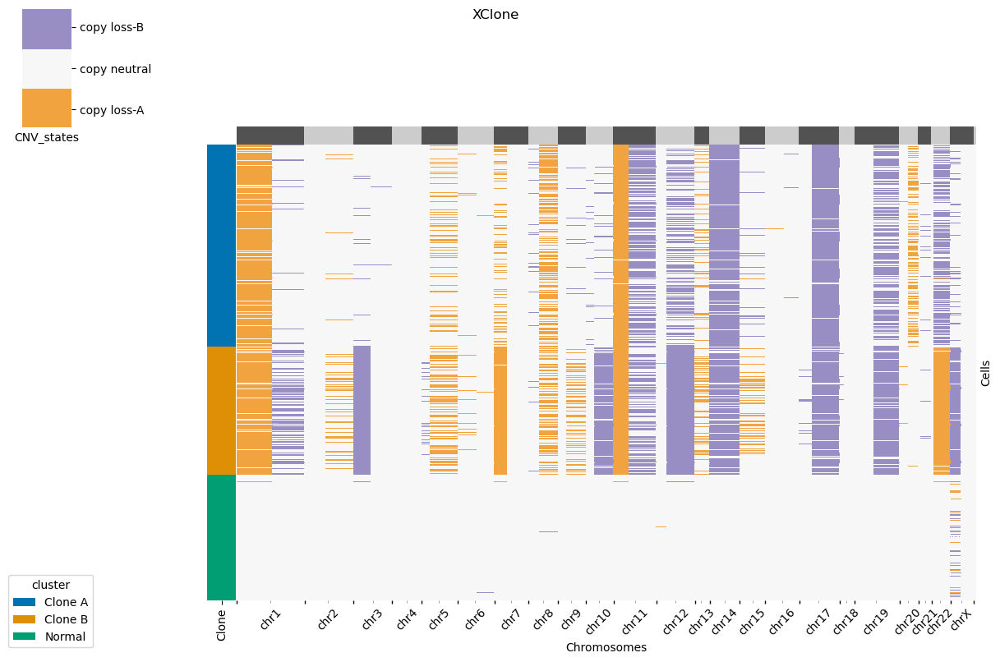

In [135]:
## if you have limited ref cells , you can set theo_baf as 0.5   *important
# merge_Xdata.var["theo_BAF"] = 0.5

used_specific_states = xclone.model.gene_specific_BAF(merge_Xdata, theo_states= guide_theo_states, specific_BAF = "ref_BAF_phased")


merge_Xdata = xclone.model.calculate_Xemm_prob_bb(merge_Xdata, AD_key = "ad_bin1_phased", DP_key = "dp_bin", concentration = 100, 
                                                  outlayer = "bin_phased_BAF_specific_center_emm_prob_log", states = used_specific_states)

merge_Xdata = xclone.model.BAF_smoothing(merge_Xdata, 
                  inlayer = "bin_phased_BAF_specific_center_emm_prob_log",
                  outlayer = "bin_phased_BAF_specific_center_emm_prob_log_KNN",
                  KNN_connectivities_key = "connectivities_expr",
                  KNN_smooth = True)

start_prob_ = np.array([0.2, 0.6, 0.2])
t = 1e-6
trans_prob_ = np.array([[1-2*t, t, t],[t, 1-2*t, t],[t, t, 1-2*t]])
merge_Xdata = xclone.model.XHMM_smoothing(merge_Xdata, start_prob = start_prob_,  trans_prob = trans_prob_, emm_inlayer = "bin_phased_BAF_specific_center_emm_prob_log_KNN", nproc = 80, verbose = False)
xclone.pl.CNV_visualization2(merge_Xdata, weights = False, cell_anno_key = "cluster", save_file = True, out_file = baf_smooth_fig)

In [136]:
merge_Xdata

AnnData object with n_obs × n_vars = 1097 × 347
    obs: 'copykat.pred', 'cluster.pred', 'cluster'
    var: 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'gene1_stop', 'bin_stop_arm', 'bin_stop_chr_arm', 'bin_stop_band', 'bin_idx', 'bin_idx_cum', 'GeneName_lst', 'GeneID_lst', 'bin_genes_cnt', 'ref_BAF_phased', 'ref_BAF_phased_clipped'
    uns: 'GeneName_lst', 'GeneID_lst', 'local_phasing_key', 'local_phasing_len'
    layers: 'ad_bin', 'ad_bin1', 'dp_bin', 'ad_bin_phased', 'ad_bin1_phased', 'BAF', 'BAF_phased', 'fill_BAF_phased', 'BAF_phased_KNN', 'BAF_phased_WMA', 'BAF_phased_KNN_WMA', 'BAF_phased_WMA_KNN', 'bin_phased_BAF_specific_center_emm_prob_log', 'bin_phased_BAF_specific_center_emm_prob_log_KNN', 'emm_prob_log_noHMM', 'emm_prob_noHMM', 'posterior_mtx', 'posterior_mtx_log'
    obsp: 'connectivities_expr'

In [137]:
merge_Xdata.write(BAF_final_file)

### More exploration

In [165]:
celltype_file = "../../raw_data/TNBC1_data/tnbc1_celltype_diffresolution.txt"

merge_Xdata = xclone.pp.extra_anno(merge_Xdata, celltype_file, barcodes_key = "cell", 
                                   cell_anno_key = ["cell type1","cell type2", "cell type3", "cell type4", "cell type5", "cell type6" ], 
                                   sep ="\t")

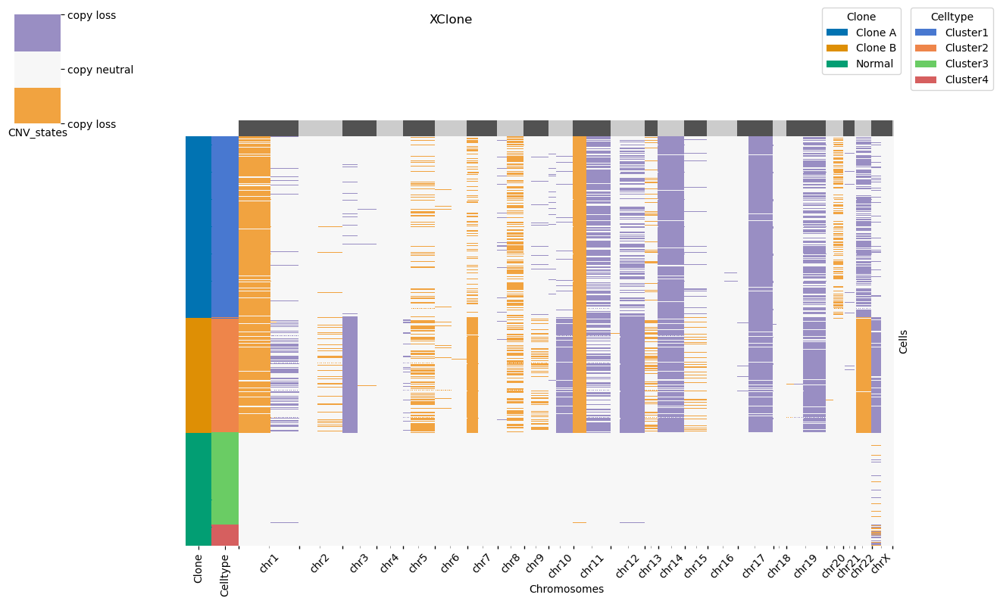

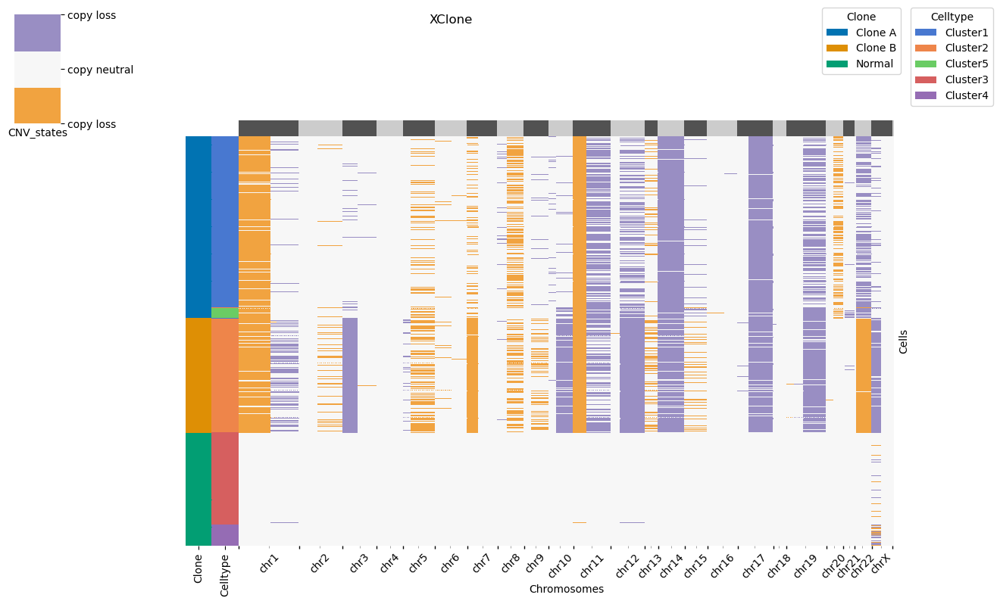

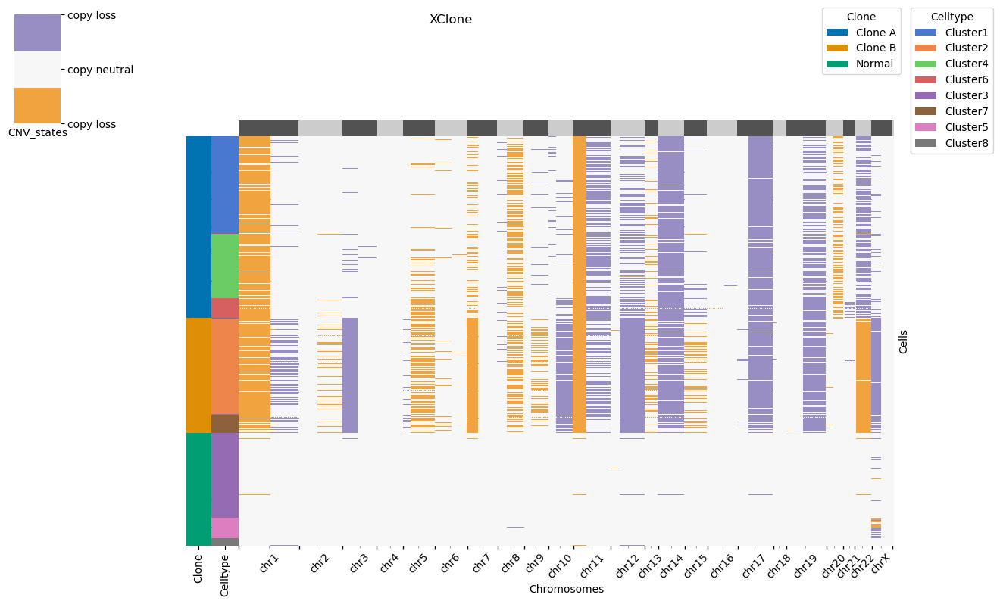

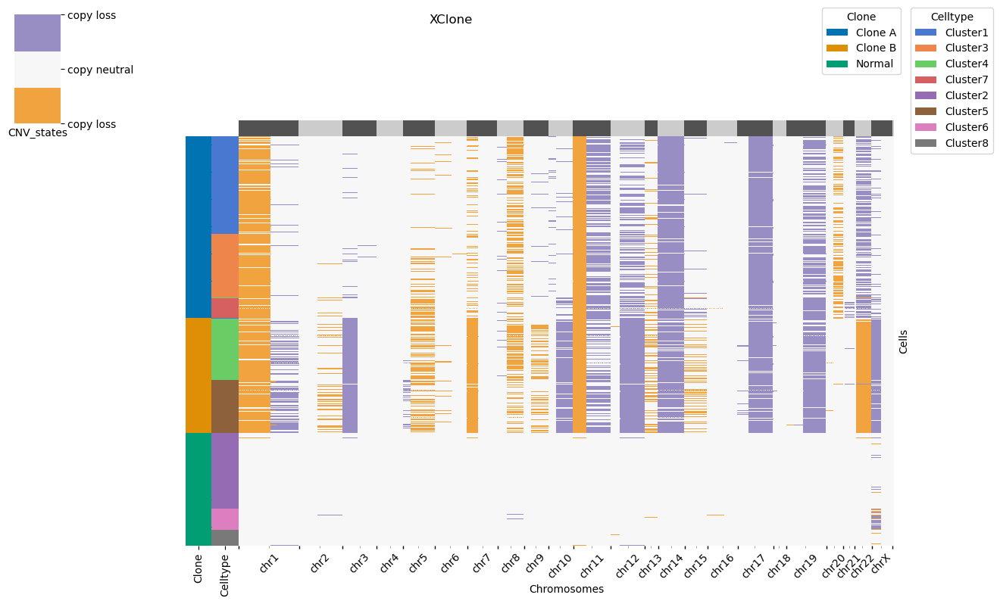

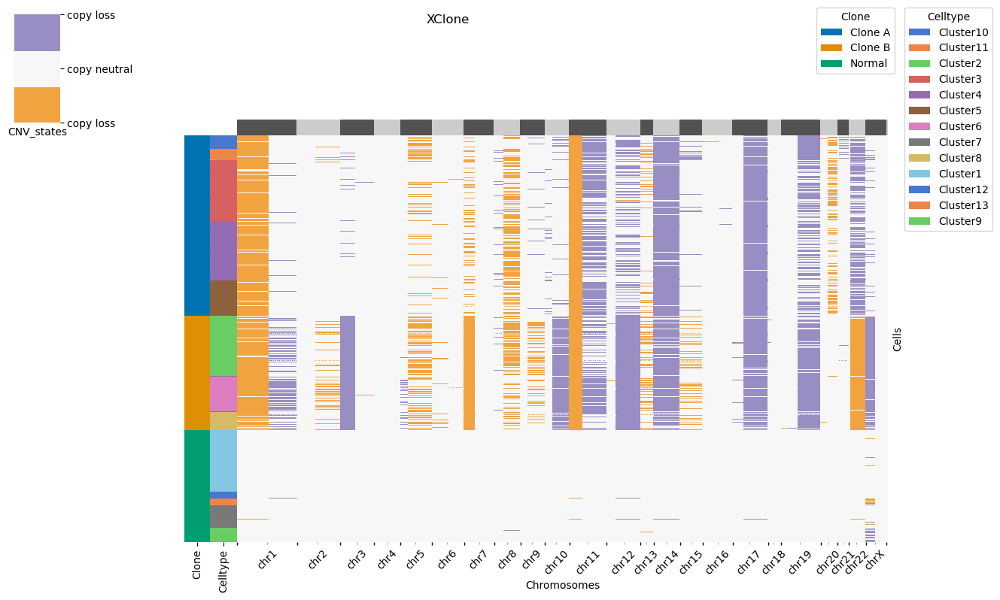

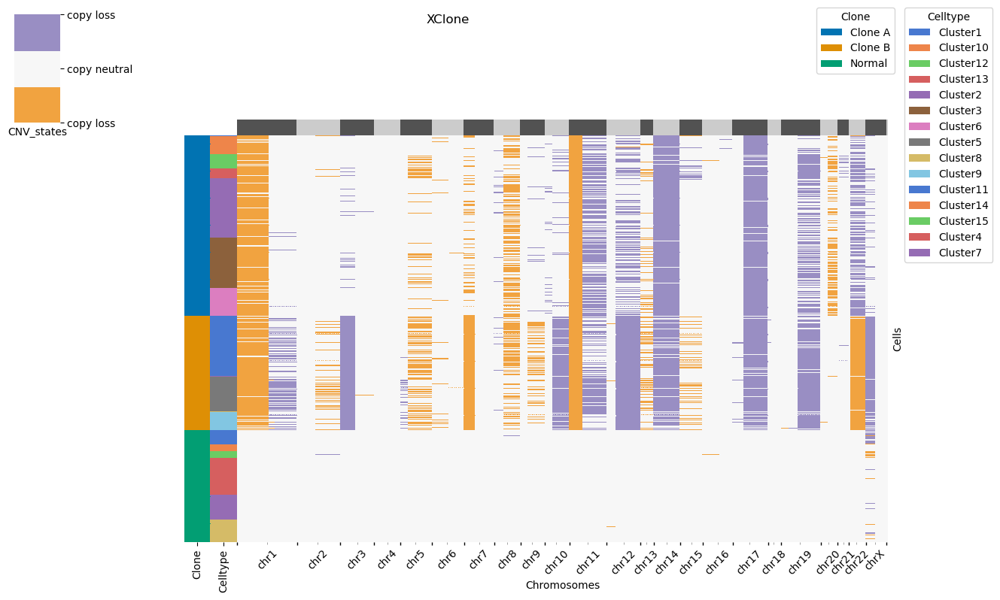

In [166]:
xclone.pl.CNV_visualization2_complex(merge_Xdata,  weights = False, cell_anno_key = ["cluster", "cell type1"])
xclone.pl.CNV_visualization2_complex(merge_Xdata,  weights = False, cell_anno_key = ["cluster", "cell type2"])
xclone.pl.CNV_visualization2_complex(merge_Xdata,  weights = False, cell_anno_key = ["cluster", "cell type3"])
xclone.pl.CNV_visualization2_complex(merge_Xdata,  weights = False, cell_anno_key = ["cluster", "cell type4"])
xclone.pl.CNV_visualization2_complex(merge_Xdata,  weights = False, cell_anno_key = ["cluster", "cell type5"])
xclone.pl.CNV_visualization2_complex(merge_Xdata,  weights = False, cell_anno_key = ["cluster", "cell type6"])

#### mito

In [167]:
mit_file = "/home/rthuang/ResearchProject/XClone/raw_data/TNBC1_data/MQuad_mitclones_df.csv"


merge_Xdata = xclone.pp.extra_anno(merge_Xdata, mit_file, barcodes_key = "cell", 
                                   cell_anno_key = ["mit_clone_id"], 
                                   sep =",")

clone2annotation = {
     0: 'Clone1',
     1: 'Clone2'}
merge_Xdata.obs["mit_ID"] = merge_Xdata.obs["mit_clone_id"].map(clone2annotation).astype('category')

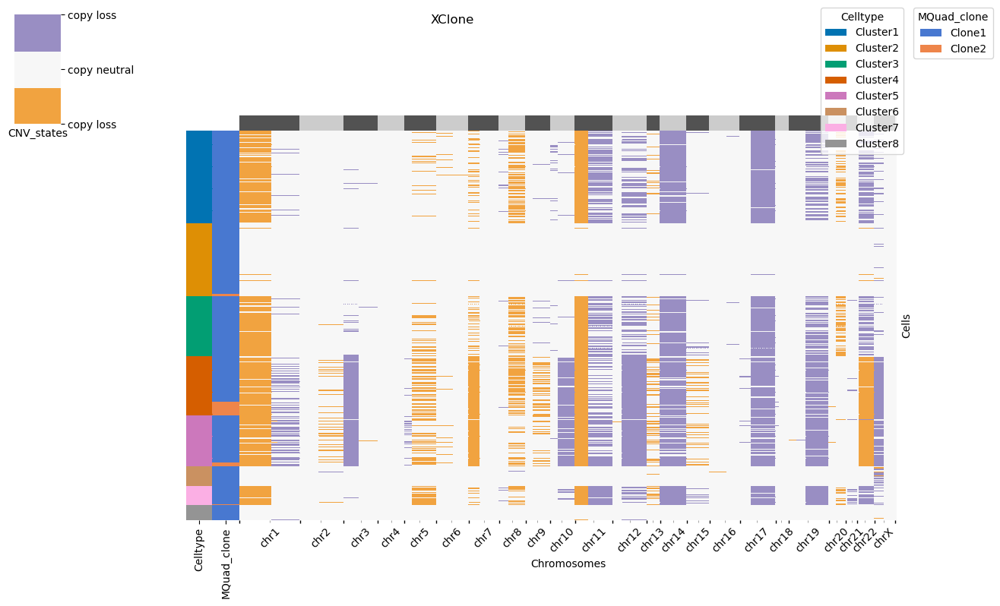

In [168]:
## pick this one
xclone.pl.CNV_visualization2_complex(merge_Xdata,  weights = False, cell_anno_key = [ "cell type4", "mit_ID"], clusters_display_name = [ "Celltype", "MQuad_clone"])

In [171]:
merge_Xdata.write(explore_BAF_file)

... storing 'tumor' as categorical


## Part IV-XClone RDR&BAF Combination

### params setting

In [6]:
## files prepared
## params for this dataset
dataset_name = "TNBC1_scRNA"


out_dir = "/storage/yhhuang/users/rthuang/xclone/manuscript/TNBC1_scRNA/data/"
fig_dir = "/storage/yhhuang/users/rthuang/xclone/manuscript/TNBC1_scRNA/plot/"

# xclone.al.dir_make(out_dir)
# xclone.al.dir_make(fig_dir)

## use_file
# output after CNV calling
BAF_final_file = out_dir + "BAF_merge_Xdata_KNN_HMM_post.h5ad"
## use RDR connectivities
RDR_final_file = out_dir + "RDR_adata_KNN_HMM_post.h5ad"

RDR_combine_corrected_file = out_dir + "combine_adata_corrected.h5ad"
combine_final_file = out_dir + "combined_final.h5ad"

# visualization
# default:XClone
cell_anno_key_plot = "cluster"

fig_title = ""
combine_res_base_fig = fig_dir + dataset_name + "combine_base.png"
combine_res_select_fig = fig_dir + dataset_name + "combine_select.png"

### IV-I load preprocessed dataset

In [145]:
import anndata as an

# RDR_Xdata = an.read_h5ad(RDR_final_file)

RDR_Xdata = an.read_h5ad(explore_RDR_file)
BAF_merge_Xdata = an.read_h5ad(BAF_final_file)

### IV-II bin to genes mapping

In [146]:
# map BAF to RDR
combine_Xdata = xclone.model.bin_to_gene_mapping(BAF_merge_Xdata,
                        RDR_Xdata,
                        Xlayer = "posterior_mtx",
                        extend_layer = "BAF_extend_post_prob",
                        return_prob = False)

[XClone] BAF extend bins to genes.
[XClone data checking]: RDR and BAF in same cell order
No genes in this bin: 3103 3152 , skip this bin.
No genes in this bin: 21554 21654 , skip this bin.
No genes in this bin: 22754 22839 , skip this bin.
No genes in this bin: 30061 30063 , skip this bin.
No genes in this bin: 33372 33472 , skip this bin.


In [147]:
combine_Xdata = xclone.model.CNV_prob_combination(combine_Xdata,
                         RDR_layer = "posterior_mtx",
                         BAF_layer = "BAF_extend_post_prob")

In [148]:
combine_Xdata

AnnData object with n_obs × n_vars = 1097 × 6397
    obs: 'copykat.pred', 'cluster.pred', 'cluster', 'library_ratio', 'library_alpha', 'sample_chr_total', 'ref_chr_total', 'sample_chr_total_normalization', 'library_ratio_capped', 'counts_ratio', 'cell type1', 'cell type2', 'cell type3', 'cell type4', 'cell type5', 'cell type6', 'mit_clone_id', 'confident', 'tumor', 'copykat', 'mit_ID'
    var: 'GeneName', 'GeneID', 'chr', 'start', 'stop', 'arm', 'chr_arm', 'band', 'ref_avg', 'dispersion', 'gene_dispersion_bse', 'dispersion_capped', 'gene_index'
    uns: 'CNV_ratio', 'Logliklihood', 'data_mode', 'data_notes', 'dispersion_base_celltype', 'fit_dispersion_removed_genes', 'genome_mode', 'group_genes', 'guide_CNV_chrs_use_anno_key', 'guide_CNV_chrs_use_layers', 'log', 'neighbors', 'pca', 'rank_marker_genes', 'ref_log_expression_brk', 'sort_chr_dict'
    obsm: 'X_pca', 'select_chr_index'
    varm: 'PCs'
    layers: 'RDR_smooth', 'WMA_smoothed', 'emm_prob_log', 'emm_prob_log_noHMM', 'emm_prob_

In [149]:
combine_Xdata.write(RDR_combine_corrected_file)

### IV-III visualization

In [7]:
# import anndata as an
# combine_Xdata = an.read_h5ad(RDR_combine_corrected_file)

In [8]:
combine_Xdata = xclone.model.CNV_prob_merge_for_plot(combine_Xdata, Xlayer = "loss_corrected_prob1")

In [9]:
combine_Xdata.write(combine_final_file)

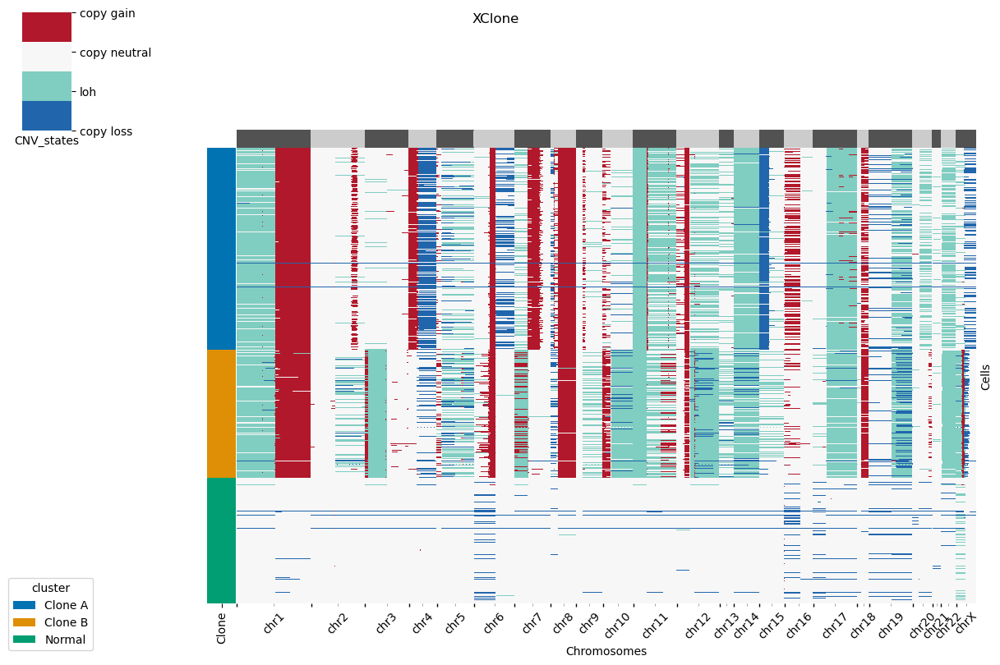

In [150]:
## BASE PLOT
xclone.pl.CNV_visualization_combine(combine_Xdata, Xlayer = "prob1_merge", cell_anno_key = "cluster",  save_file = True, out_file = combine_res_base_fig)

In [ ]:
#### combine_Xdata = xclone.model.CNV_prob_merge_for_plot(combine_Xdata, Xlayer = "loss_corrected_prob1")

cell_anno_key_plot = "cluster"

colorbar_ticks = [0.25,1,2,2.75]
colorbar_label = ["copy loss","loh", "copy neutral", "copy gain"]
xclone.pl.CNV_visualization_combine(combine_Xdata, Xlayer = "plot_prob_merge1", cell_anno_key = cell_anno_key_plot, color_map_name = "combine_cmap", states_num = 4, 
                                    colorbar_ticks =colorbar_ticks,
                                    colorbar_label =colorbar_label)

colorbar_ticks = [0,1,2,3,4]
colorbar_label = ["copy lossA", "copy lossB", "LOH", "copy neutral", "copy gain"]
xclone.pl.CNV_visualization_combine(combine_Xdata, Xlayer = "plot_prob_merge2", cell_anno_key = cell_anno_key_plot, color_map_name = "combine_cmap2", states_num = 5,
                                    colorbar_ticks =colorbar_ticks,
                                    colorbar_label =colorbar_label
                                    )

colorbar_ticks = [0,1,2,3,4,5]
colorbar_label = ["copy lossA", "copy lossB","LOH-A", "LOH-B", "copy neutral", "copy gain"]
xclone.pl.CNV_visualization_combine(combine_Xdata, Xlayer = "plot_prob_merge3", cell_anno_key = cell_anno_key_plot, color_map_name = "combine_cmap3", states_num = 6,
                                    colorbar_ticks =colorbar_ticks,
                                    colorbar_label =colorbar_label,
                                   save_file = True, out_file = combine_res_select_fig)

colorbar_ticks = [0,1,2,3,4]
colorbar_label = ["copy loss","LOH-A", "LOH-B",  "copy neutral", "copy gain"]
xclone.pl.CNV_visualization_combine(combine_Xdata, Xlayer = "plot_prob_merge4", cell_anno_key = cell_anno_key_plot, color_map_name = "combine_cmap4", states_num = 5,
                                    colorbar_ticks =colorbar_ticks,
                                    colorbar_label =colorbar_label)

### more exploration

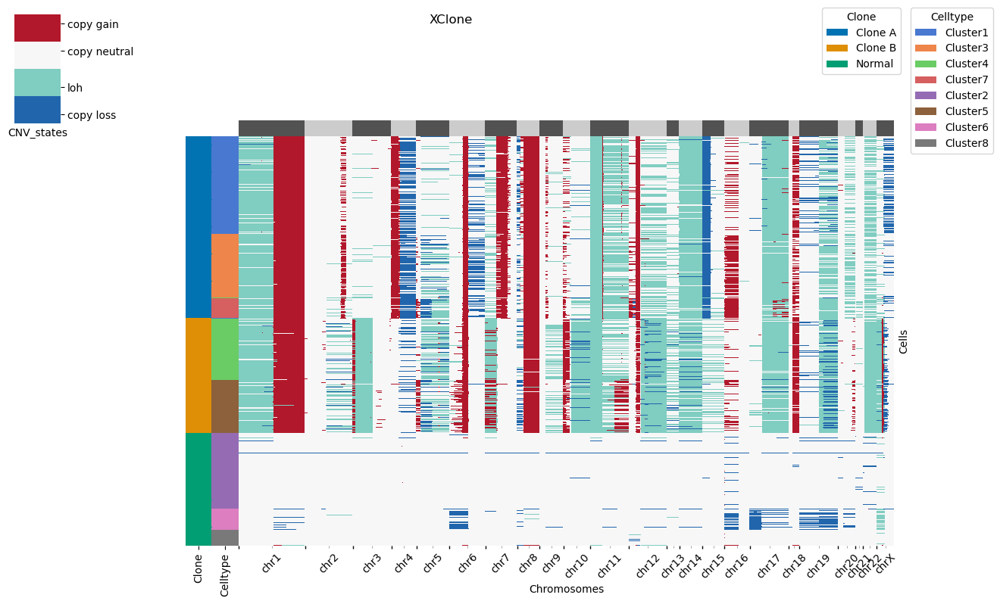

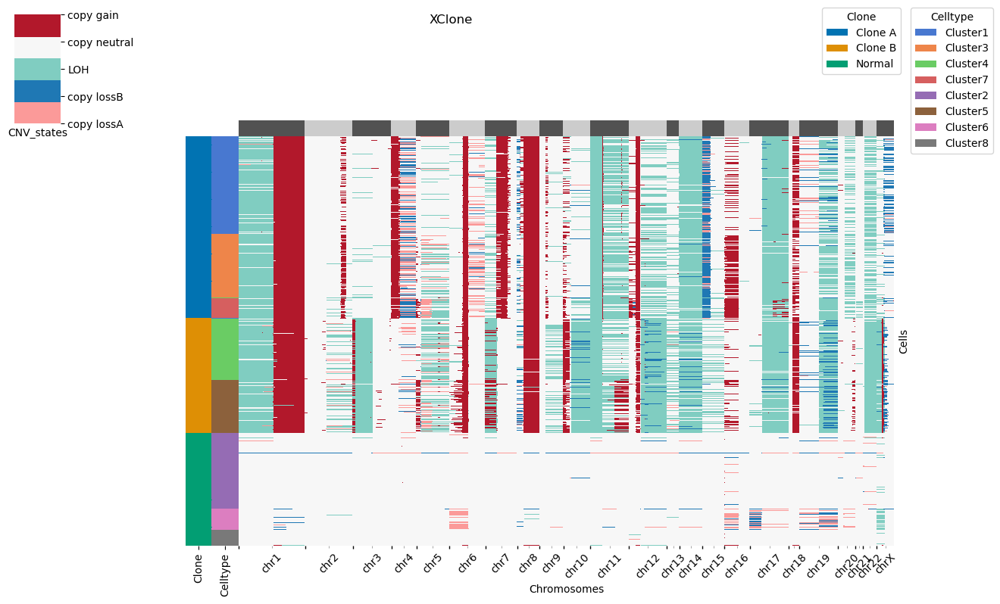

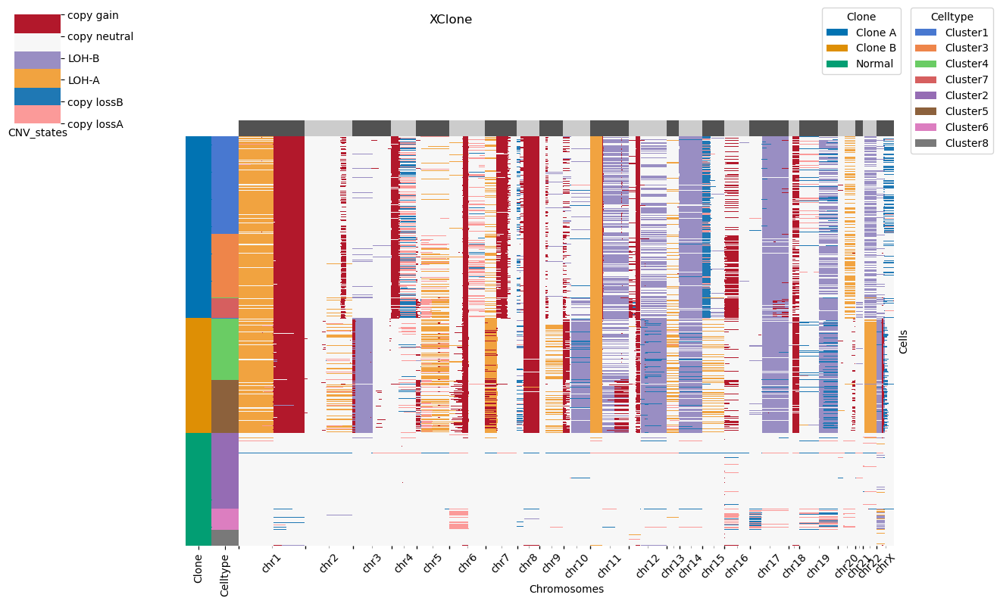

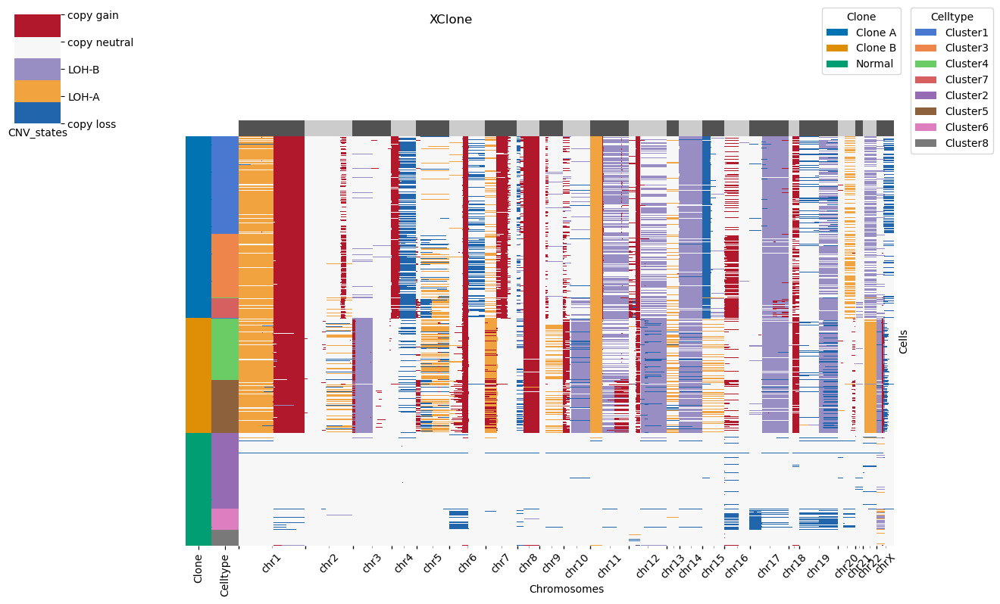

In [163]:
cell_anno_key_plot = ["cluster", "cell type4"]

colorbar_ticks = [0.25,1,2,2.75]
colorbar_label = ["copy loss","loh", "copy neutral", "copy gain"]
xclone.pl.complex_CNV_visualization_combine(combine_Xdata, Xlayer = "plot_prob_merge1", 
                                            cell_anno_key = cell_anno_key_plot, 
                                            color_map_name = "combine_cmap", 
                                            states_num = 4, 
                                            colorbar_ticks =colorbar_ticks,
                                            colorbar_label =colorbar_label)

colorbar_ticks = [0,1,2,3,4]
colorbar_label = ["copy lossA", "copy lossB", "LOH", "copy neutral", "copy gain"]
xclone.pl.complex_CNV_visualization_combine(combine_Xdata, Xlayer = "plot_prob_merge2", 
                                            cell_anno_key = cell_anno_key_plot, 
                                            color_map_name = "combine_cmap2", states_num = 5,
                                        colorbar_ticks =colorbar_ticks,
                                        colorbar_label =colorbar_label)

colorbar_ticks = [0,1,2,3,4,5]
colorbar_label = ["copy lossA", "copy lossB","LOH-A", "LOH-B", "copy neutral", "copy gain"]
xclone.pl.complex_CNV_visualization_combine(combine_Xdata, Xlayer = "plot_prob_merge3", 
                                            cell_anno_key = cell_anno_key_plot, 
                                            color_map_name = "combine_cmap3", states_num = 6,
                                            colorbar_ticks =colorbar_ticks,
                                            colorbar_label =colorbar_label)

colorbar_ticks = [0,1,2,3,4]
colorbar_label = ["copy loss","LOH-A", "LOH-B",  "copy neutral", "copy gain"]
xclone.pl.complex_CNV_visualization_combine(combine_Xdata, Xlayer = "plot_prob_merge4", 
                                            cell_anno_key = cell_anno_key_plot, 
                                            color_map_name = "combine_cmap4", states_num = 5,
                                            colorbar_ticks =colorbar_ticks,
                                            colorbar_label =colorbar_label)

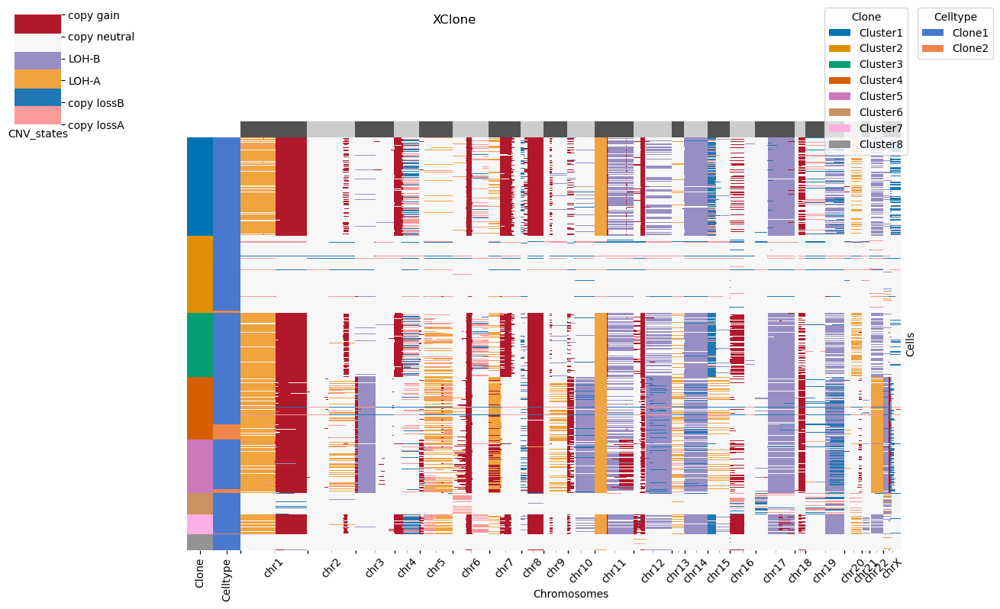

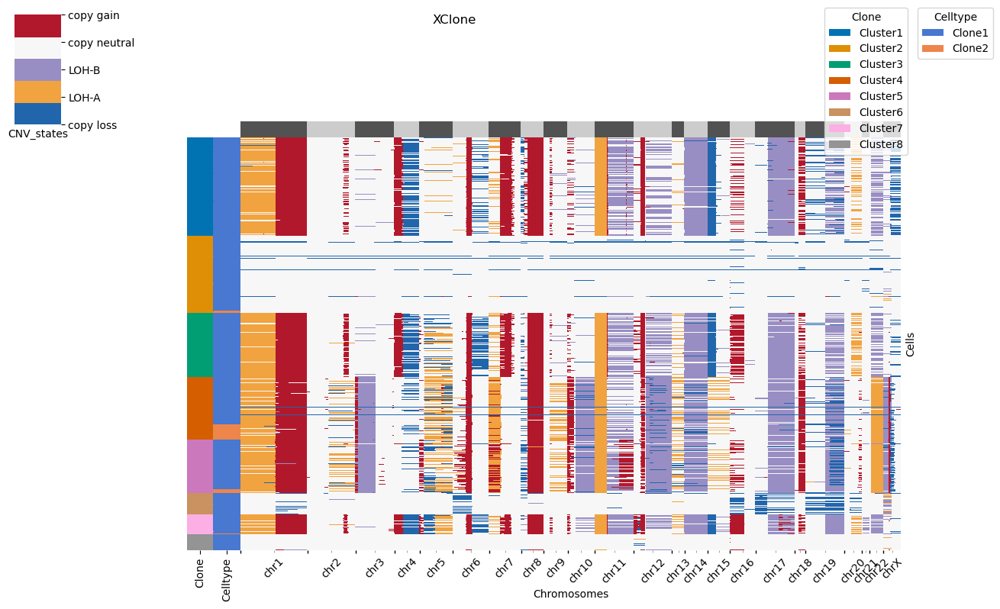

In [10]:
cell_anno_key_plot = ["cell type4", "mit_ID"]

colorbar_ticks = [0,1,2,3,4,5]
colorbar_label = ["copy lossA", "copy lossB","LOH-A", "LOH-B", "copy neutral", "copy gain"]
xclone.pl.complex_CNV_visualization_combine(combine_Xdata, Xlayer = "plot_prob_merge3", 
                                            cell_anno_key = cell_anno_key_plot, 
                                            color_map_name = "combine_cmap3", states_num = 6,
                                            colorbar_ticks =colorbar_ticks,
                                            colorbar_label =colorbar_label)

colorbar_ticks = [0,1,2,3,4]
colorbar_label = ["copy loss","LOH-A", "LOH-B",  "copy neutral", "copy gain"]
xclone.pl.complex_CNV_visualization_combine(combine_Xdata, Xlayer = "plot_prob_merge4", 
                                            cell_anno_key = cell_anno_key_plot, 
                                            color_map_name = "combine_cmap4", states_num = 5,
                                            colorbar_ticks =colorbar_ticks,
                                            colorbar_label =colorbar_label)

# Show ground truth for comparasion

(-0.5, 1403.5, 794.5, -0.5)

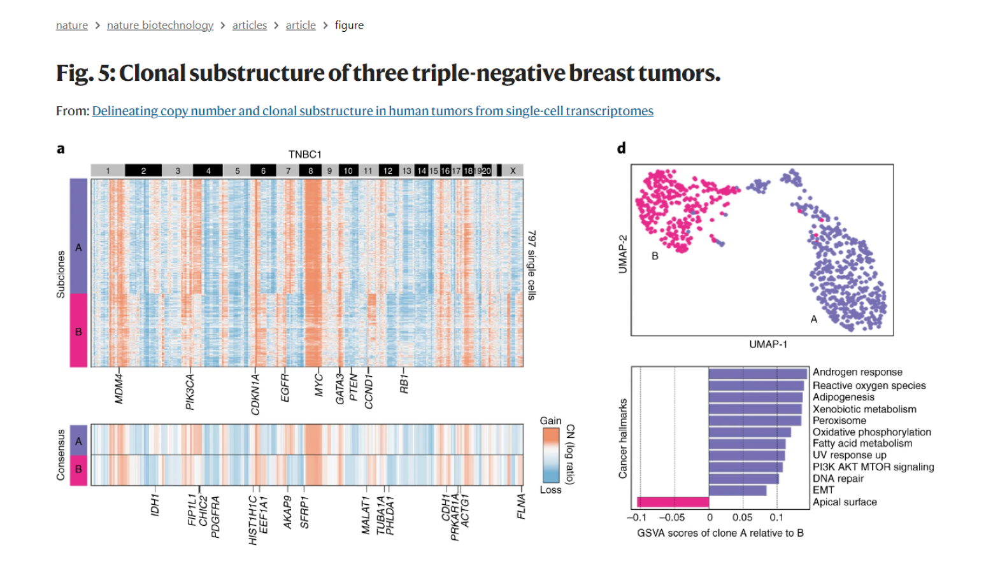

In [1]:
#### %matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('/home/rthuang/ResearchProject/XClone/raw_data/TNBC1_data/TNBC1_from_copykat.png')
figsize = (20,12)
fig, ax = plt.subplots(1,1,figsize=figsize)
imgplot = ax.imshow(img)
ax.axis('off')
plt.show()
